### import libs

In [309]:
# import scikit-allel
import allel
# check which version is installed
print(allel.__version__)
import pandas as pd
from scipy.spatial.distance import squareform
import seaborn as sns
import numpy as np

1.3.13


### import data

In [310]:
# vcf data
callset = allel.read_vcf('/data/proj2/home/students/a.nalakath/fg60_biallelic_snps.vcf.gz')
gt = allel.GenotypeArray(callset['calldata/GT'])

In [311]:
#callset['variants/POS']

In [312]:
# check
print(type(gt))

print(gt.shape)

<class 'allel.model.ndarray.GenotypeArray'>
(458599, 60, 2)


In [313]:
# for removing the extra dimension to this -(variants × samples × 1 → variants × samples)
gt_h = gt.haploidify_samples()

In [314]:
print(type(gt_h))

print(gt_h.shape[1])  # Number of haplotypes

<class 'allel.model.ndarray.HaplotypeArray'>
60


In [315]:
# this is to convert haplotype array back to genotype array
gt_hd = gt_h.to_genotypes(ploidy=1)

In [316]:
print(gt_hd.shape)

print(type(gt_hd))

(458599, 60, 1)
<class 'allel.model.ndarray.GenotypeArray'>


In [317]:
# to change genotype call into the number of non-reference alleles
gt_hd = gt_hd.to_n_alt()

### PCA

In [319]:
#Setting -1 to NaN
#Replacing NaNs with the mean allele count per SNP
X = np.array(gt_h, dtype=float)  # Converting her to NumPy array
X[X == -1] = np.nan  # Set missing data to NaN
# Replacing NaNs with mean per SNP
col_means = np.nanmean(X, axis=0)
inds = np.where(np.isnan(X))
X[inds] = np.take(col_means, inds[1])

/tmp/ipykernel_1229973/801097229.py:3: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  X = np.array(gt_h, dtype=float)  # Converting her to NumPy array


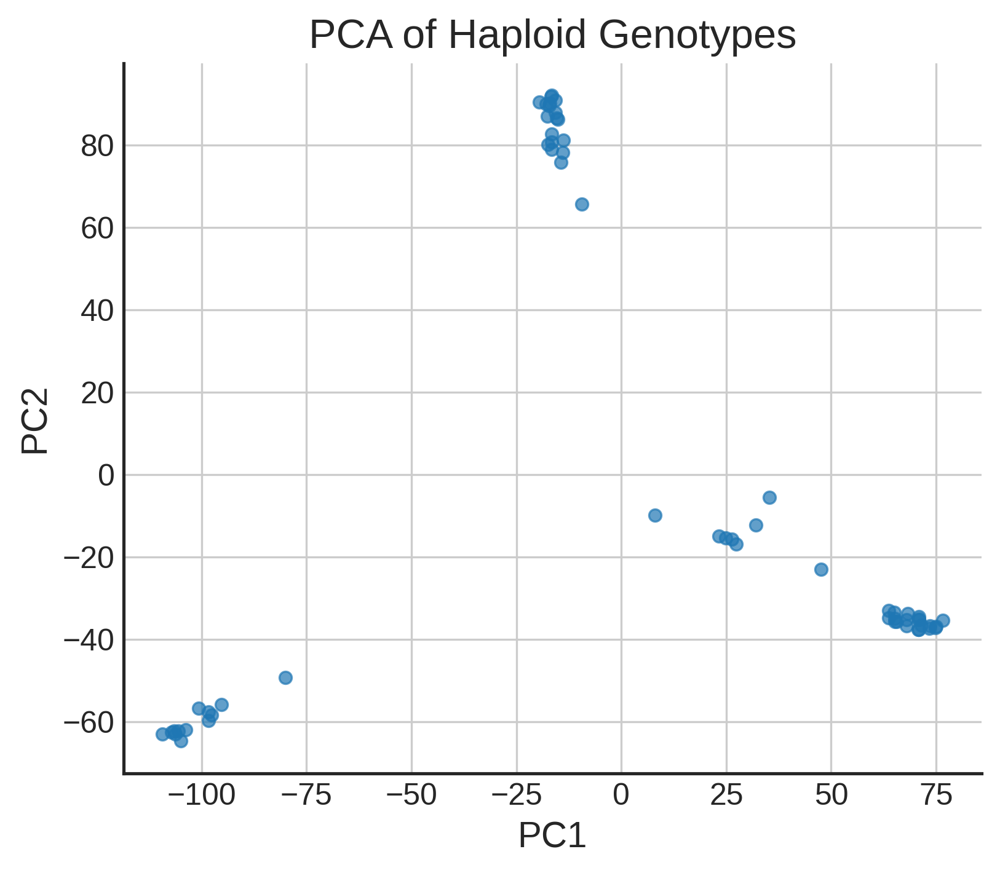

In [320]:
# PCA
from allel.stats.decomposition import GenotypePCA
from matplotlib import pyplot as plt

model = GenotypePCA(n_components=10, scaler=None)
model.fit(X)
coords = model.transform(X)

# Plot the first two PCs
plt.figure(figsize=(6, 5))
plt.scatter(coords[:, 0], coords[:, 1], alpha=0.7)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA of Haploid Genotypes')
plt.grid(True)
plt.show()

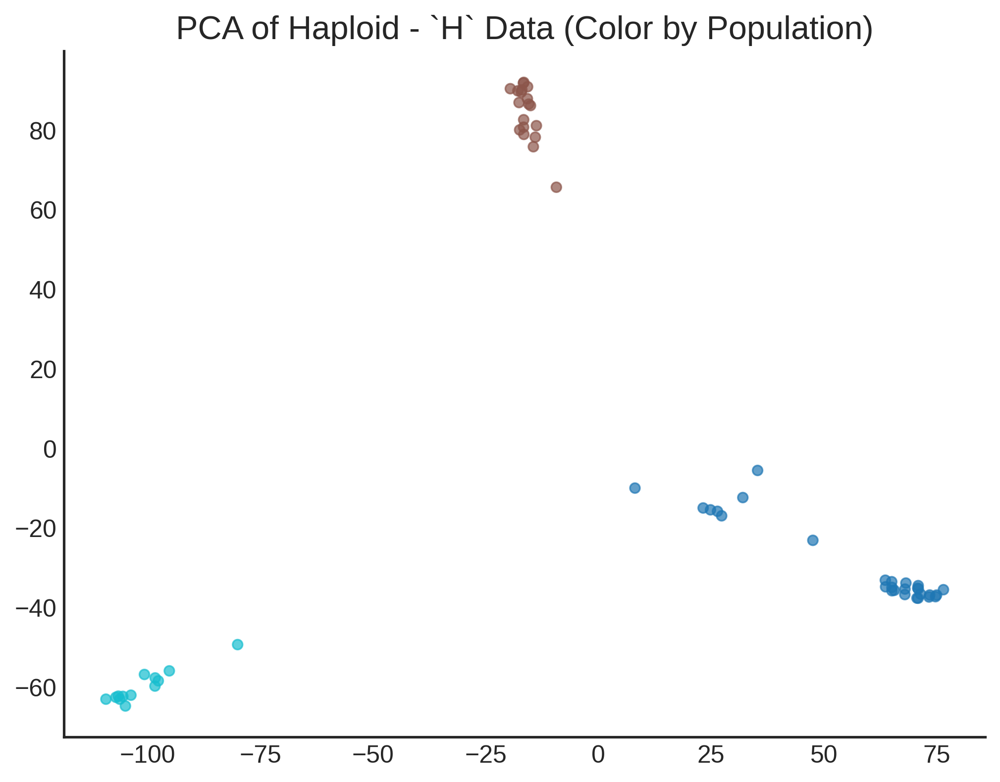

In [321]:
from sklearn.cluster import KMeans

K = 3
kmeans = KMeans(n_clusters=K, random_state=42)
labels = kmeans.fit_predict(coords)  # Assigns clusters to samples

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(coords[:, 0], coords[:, 1], c=labels, cmap='tab10', alpha=0.7)
plt.title('PCA of Haploid - `H` Data (Color by Population)')
plt.show()

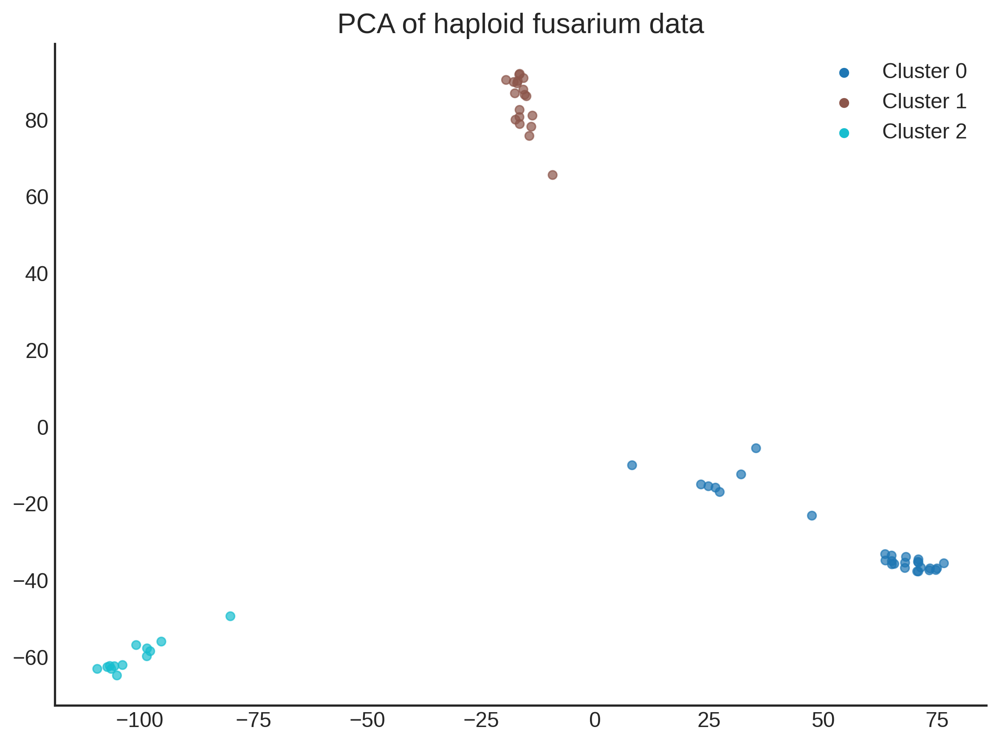

In [322]:
import numpy as np

plt.figure(figsize=(8, 6))
scatter = plt.scatter(coords[:, 0], coords[:, 1], c=labels, cmap='tab10', alpha=0.7)

# Get unique labels and their actual colors from the scatter plot
unique_labels = np.unique(labels)
colors = [scatter.cmap(scatter.norm(l)) for l in unique_labels]

# Build correct legend
for lbl, col in zip(unique_labels, colors):
    plt.scatter([], [], color=col, label=f'Cluster {lbl}')

plt.legend()
plt.title('PCA of haploid fusarium data')
plt.tight_layout()
plt.show()

In [323]:
import pandas as pd

cluster_data = pd.DataFrame({'Sample': gt_h.shape[1], 'Cluster': labels})
cluster_data.to_csv('haplo_clusters_updated.csv', index=False)
cluster_data.head()

,Sample,Cluster
0,60,1
1,60,1
2,60,1
3,60,2
4,60,0


In [324]:
# Subset by cluster
gn0 = gt_h[:, labels == 0]
gn1 = gt_h[:, labels == 1]
gn2 = gt_h[:, labels == 2]

### Linkage disequillibrium

In [325]:
#r = allel.rogers_huff_r(gt_hd) ## between loci

In [326]:
# subsetting bcoz of huge size
## subset #1

In [327]:
gt_hd_sub = gt_h[:300]

In [328]:
r = allel.rogers_huff_r(gt_hd_sub)

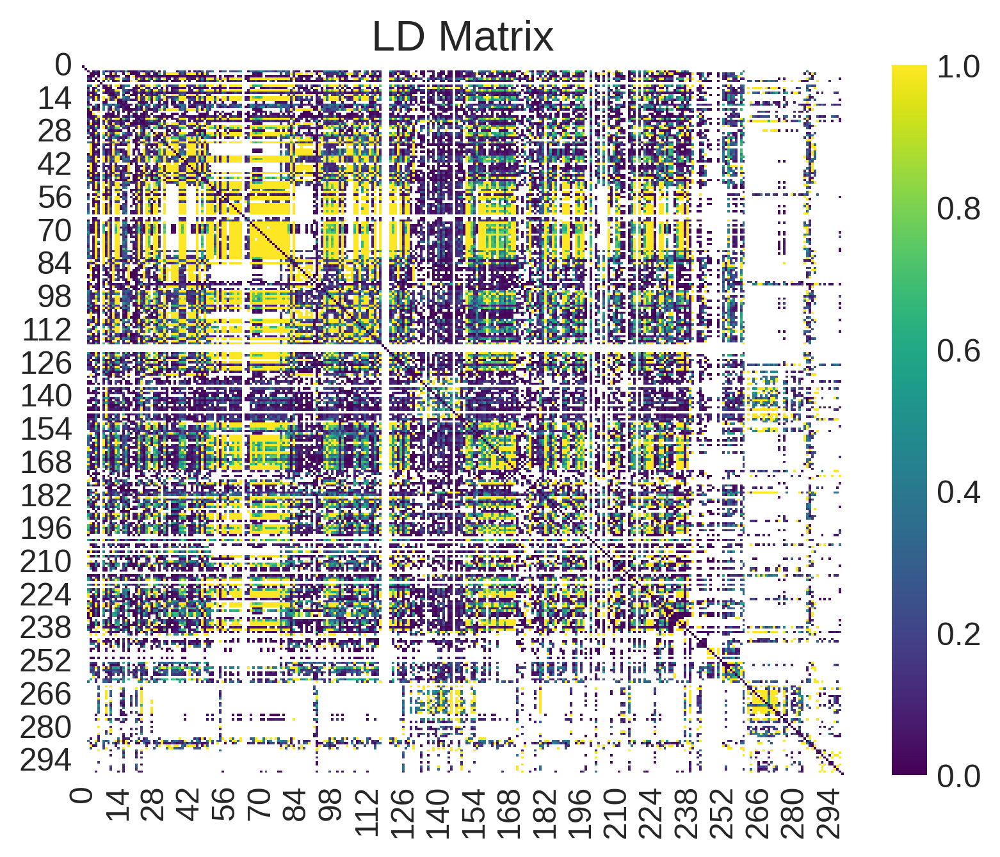

In [329]:
r2 = r ** 2
r2_matrix = squareform(r2)
sns.heatmap(r2_matrix, cmap='viridis')
plt.title('LD Matrix')
plt.show()

In [330]:
## subset #2

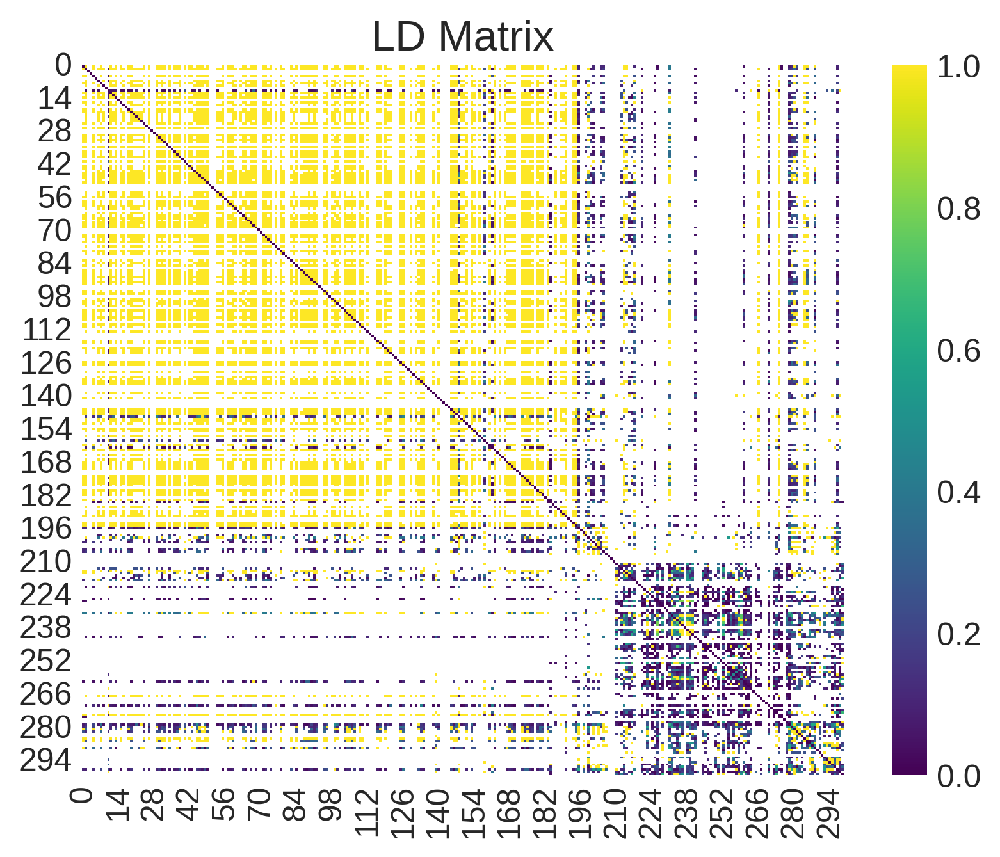

In [331]:
gt_hd_sub_2 = gt_h[300:600]
r_sub_2 = allel.rogers_huff_r(gt_hd_sub_2)
r2 = r_sub_2 ** 2
r2_matrix_2 = squareform(r2)
sns.heatmap(r2_matrix_2, cmap='viridis')
plt.title('LD Matrix')
plt.show()

<Axes: >

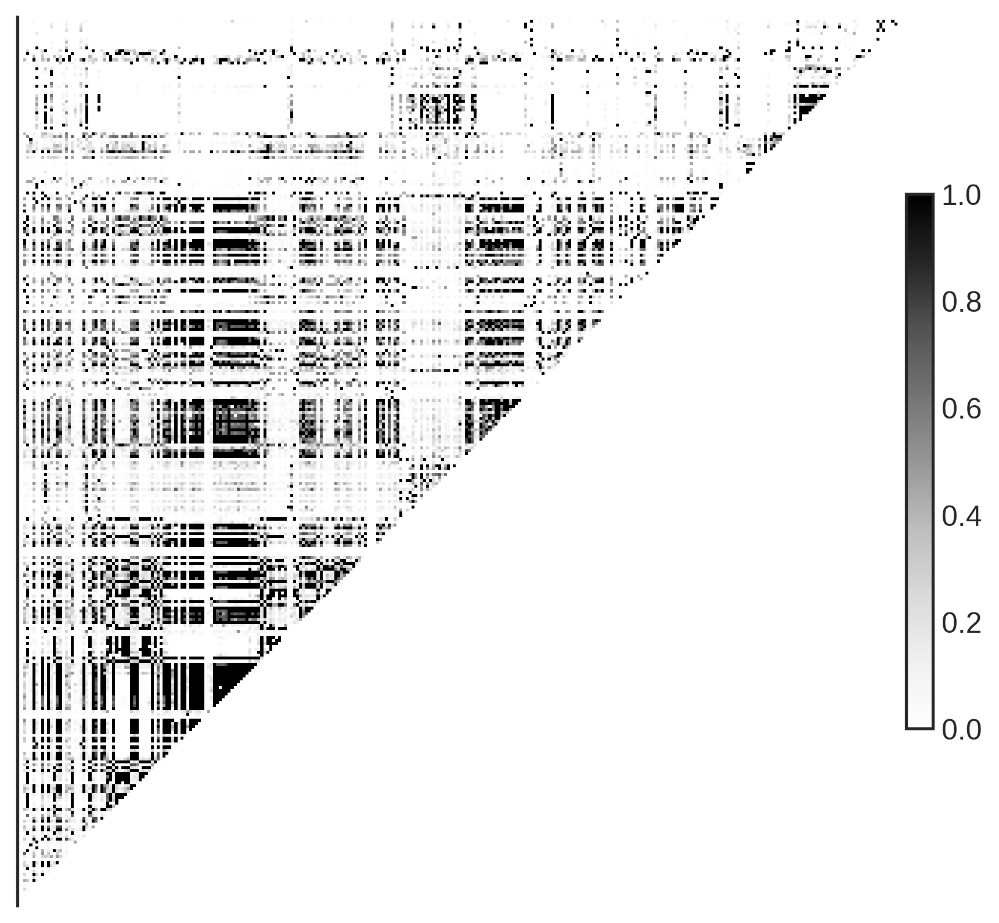

In [332]:
allel.plot_pairwise_ld(r2_matrix)

<Axes: >

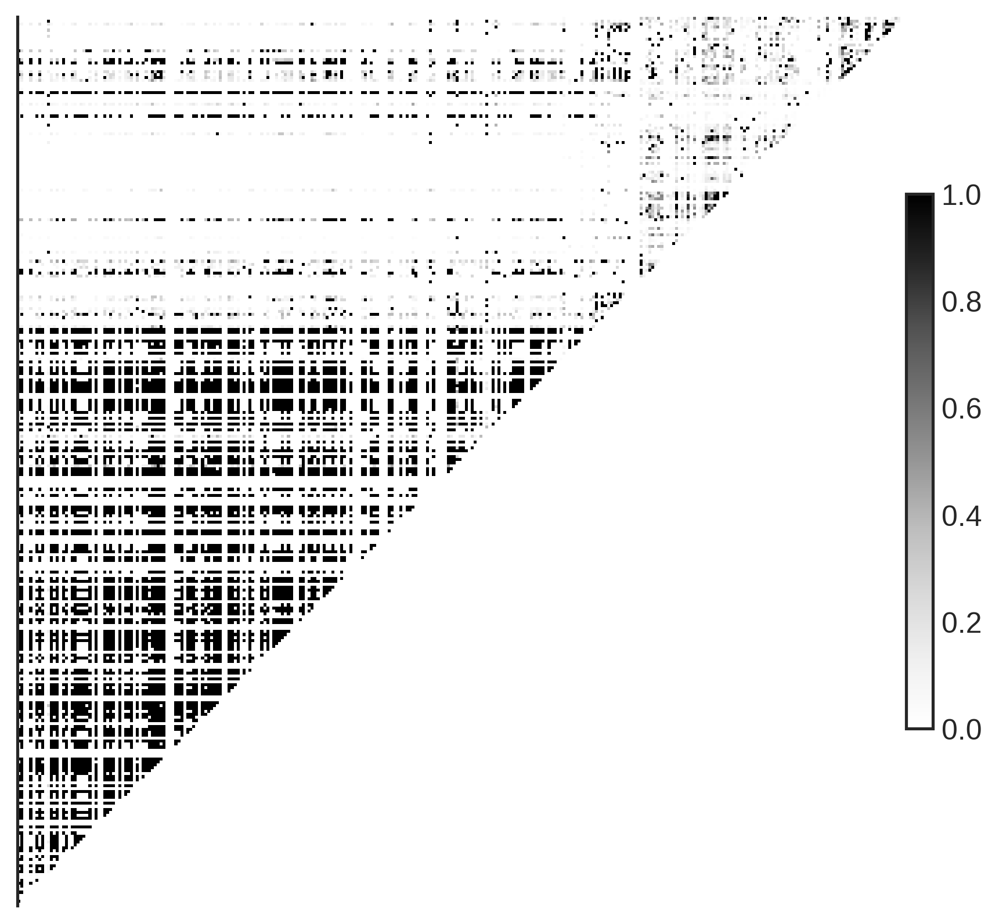

In [333]:
allel.plot_pairwise_ld(r2_matrix_2)

## LD - whole genome
### windowed_r_squared function - scikit

In [335]:
import numpy as np
np.set_printoptions(threshold=np.inf)
#np.set_printoptions(threshold=1000)

In [336]:
pos = callset['variants/POS']
#pos

In [337]:
sort_idx = np.argsort(pos)
pos_sorted = pos[sort_idx]
gt_h_sorted = gt_h[sort_idx]

In [338]:
print(gt.shape)
print(gt_h.shape)
print(gt_hd.shape)

(458599, 60, 2)
(458599, 60)
(458599, 60)


In [339]:
r2, windows, counts = allel.windowed_r_squared(
    pos_sorted,
    gt_hd,
    size=5000,
    step=5000
)

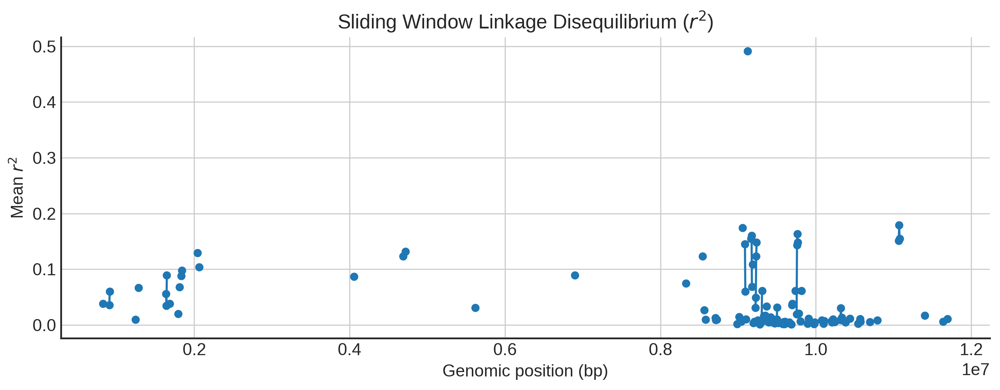

In [340]:
import matplotlib.pyplot as plt

# Midpoint of each window
midpoints = (windows[:, 0] + windows[:, 1]) / 2

# Plot
plt.figure(figsize=(10, 4))
plt.plot(midpoints, r2, marker='o', linestyle='-', linewidth=1.5)
plt.xlabel('Genomic position (bp)', fontsize=12)
plt.ylabel('Mean $r^2$', fontsize=12)
plt.title('Sliding Window Linkage Disequilibrium ($r^2$)', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

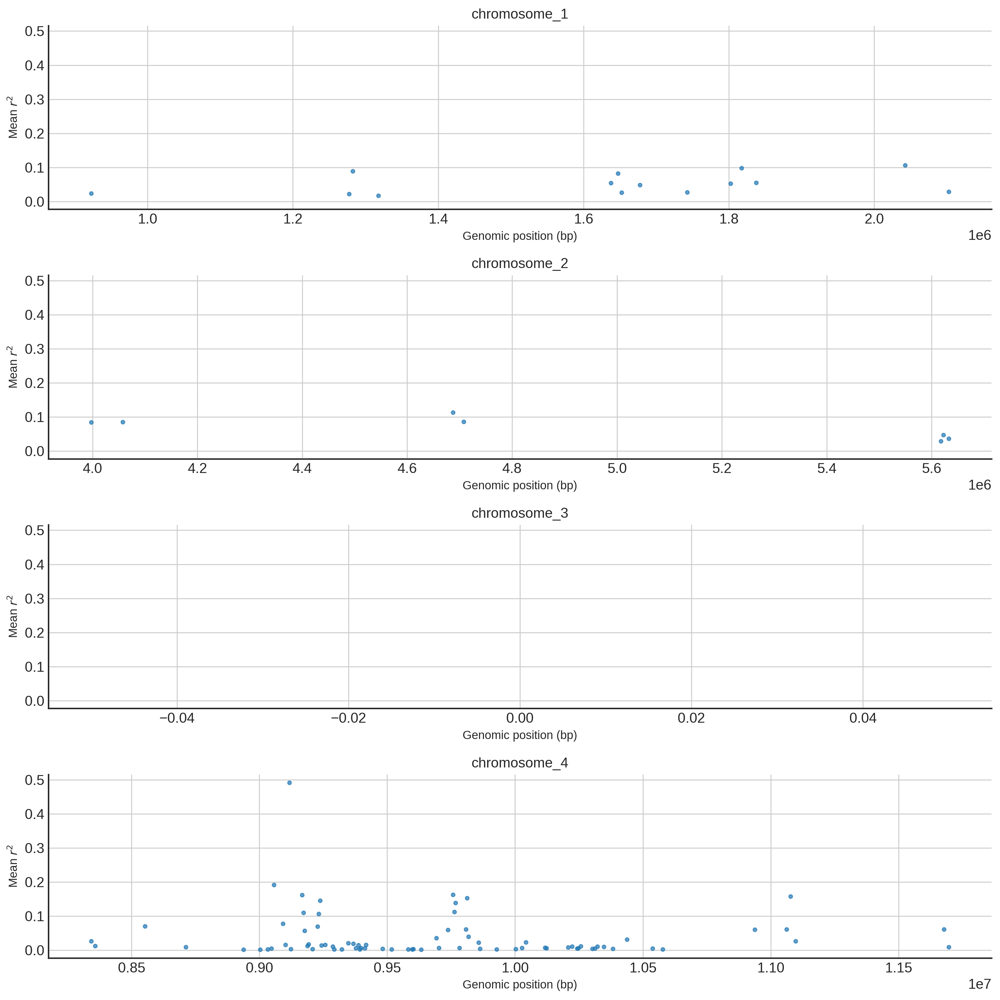

In [341]:
# Step 2: Compute windowed LD (r²)
r2, windows, counts = allel.windowed_r_squared(
    pos_sorted,
    gn,
    size=5000,
    step=5000,
    fill=np.nan  # or 0 if you want to impute LD=0 in empty windows
)

# Step 3: Get window midpoints
midpoints = (windows[:, 0] + windows[:, 1]) / 2

# Get chromosome per window by midpoint lookup
window_chroms = np.array([
    chroms[np.searchsorted(pos_sorted, mid)] for mid in midpoints
])


import matplotlib.pyplot as plt
import numpy as np

chrom_list = np.unique(window_chroms)
fig, axs = plt.subplots(len(chrom_list), 1, figsize=(12, 3 * len(chrom_list)), sharey=True)

for i, chrom in enumerate(chrom_list):
    mask = window_chroms == chrom
    pos_chrom = midpoints[mask]
    r2_chrom = r2[mask]
    
    axs[i].scatter(pos_chrom, r2_chrom, s=10, alpha=0.7)
    axs[i].set_title(f'{chrom}', fontsize=12)
    axs[i].set_xlabel('Genomic position (bp)', fontsize=10)
    axs[i].set_ylabel('Mean $r^2$', fontsize=10)
    axs[i].grid(True)

plt.tight_layout()
plt.show()

/tmp/ipykernel_1229973/2449348436.py:22: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=df, x='Chromosome', y='r2', inner='box', cut=0, scale='width')


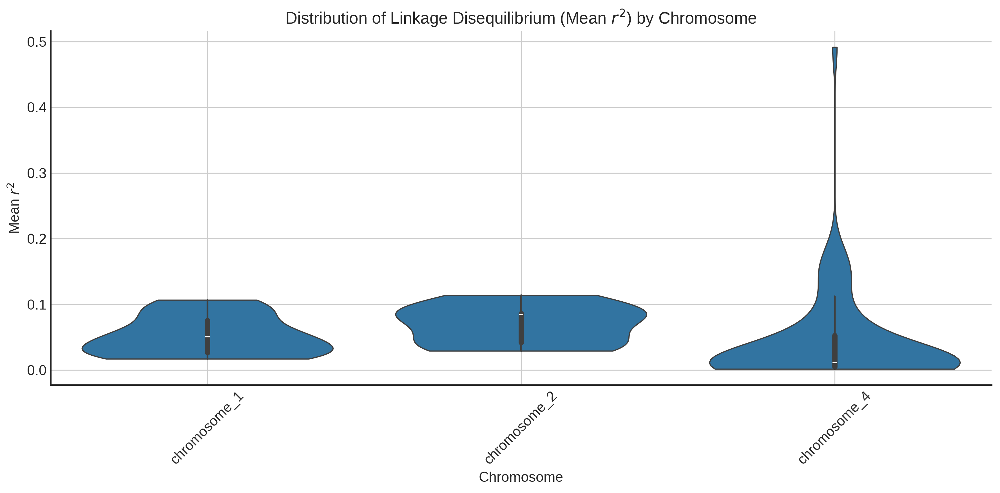

In [342]:
# --- Step 3: Compute window midpoints ---
midpoints = (windows[:, 0] + windows[:, 1]) / 2

# --- Step 4: Assign chromosome to each window ---
window_chroms = np.array([
    chroms[np.searchsorted(pos_sorted, mid)] for mid in midpoints
])

# --- Step 5: Create a DataFrame for plotting ---
df = pd.DataFrame({
    'Chromosome': window_chroms,
    'r2': r2,
    'counts': counts
})

# Optional: Filter out windows with low SNP count or NaN r²
df = df[df['counts'] >= 5]
df = df.dropna(subset=['r2'])

# --- Step 6: Plot box-and-whisker plot ---
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='Chromosome', y='r2', inner='box', cut=0, scale='width')
plt.ylabel('Mean $r^2$', fontsize=12)
plt.xlabel('Chromosome', fontsize=12)
plt.title('Distribution of Linkage Disequilibrium (Mean $r^2$) by Chromosome', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

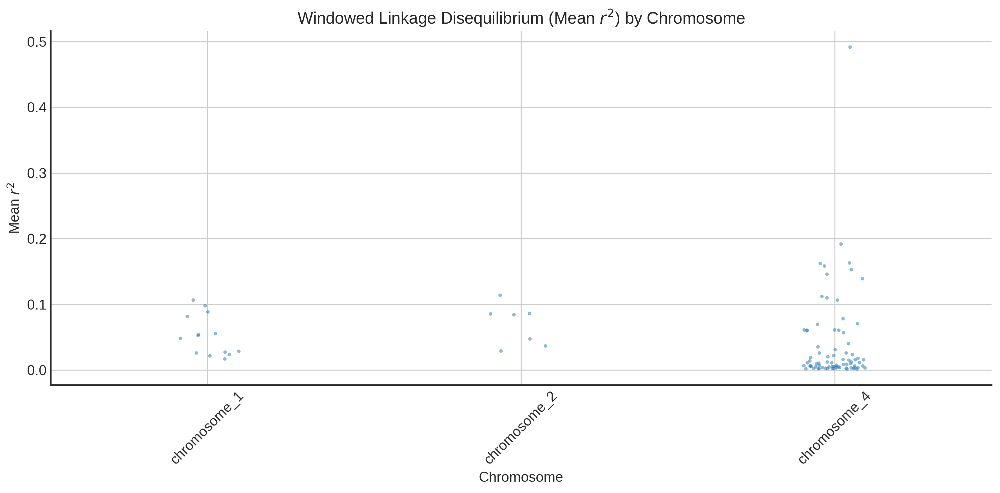

In [343]:
plt.figure(figsize=(12, 6))
sns.stripplot(data=df, x='Chromosome', y='r2', jitter=True, size=3, alpha=0.5)
plt.ylabel('Mean $r^2$', fontsize=12)
plt.xlabel('Chromosome', fontsize=12)
plt.title('Windowed Linkage Disequilibrium (Mean $r^2$) by Chromosome', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [344]:
genome_size = windows[-1, 1] - windows[0, 0]
print(f"Total genome span: {genome_size:,} bp")

Total genome span: 11,696,832 bp


In [345]:
#print(r2)

In [346]:
r2, windows, counts = allel.windowed_r_squared(
    pos_sorted,
    gt_hd,
    size=10000,
    step=10000
)

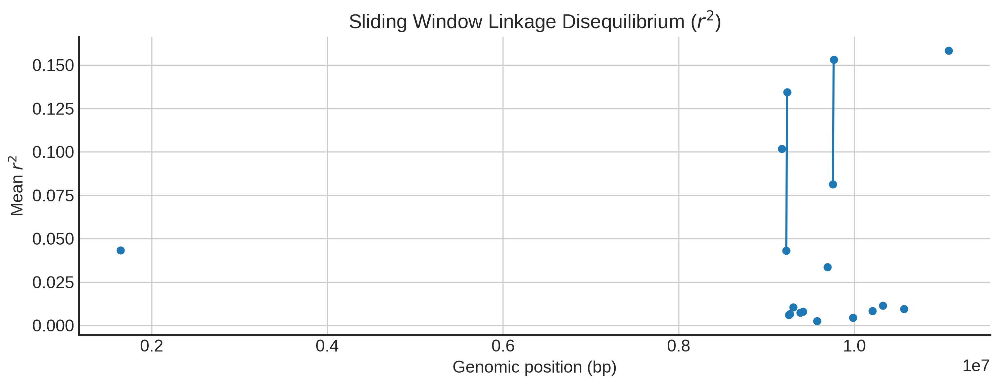

In [347]:
import matplotlib.pyplot as plt

# Midpoint of each window
midpoints = (windows[:, 0] + windows[:, 1]) / 2

# Plot
plt.figure(figsize=(10, 4))
plt.plot(midpoints, r2, marker='o', linestyle='-', linewidth=1.5)
plt.xlabel('Genomic position (bp)', fontsize=12)
plt.ylabel('Mean $r^2$', fontsize=12)
plt.title('Sliding Window Linkage Disequilibrium ($r^2$)', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

In [348]:
genome_size = windows[-1, 1] - windows[0, 0]
print(f"Total genome span: {genome_size:,} bp")

Total genome span: 11,696,832 bp


In [349]:
#print(r2)

In [350]:
r2, windows, counts = allel.windowed_r_squared(
    pos_sorted,
    gt_hd,
    size=20000,
    step=10000
)

In [351]:
#print(r2)

In [352]:
print(type(r2))
print(len(r2))
print(np.count_nonzero(~np.isnan(r2))) # no. of non zero values in the matrix
print(np.count_nonzero(~np.isnan(r2)) / len(r2) * 100) # in terms of percentage

<class 'numpy.ndarray'>
1169
3
0.2566295979469632


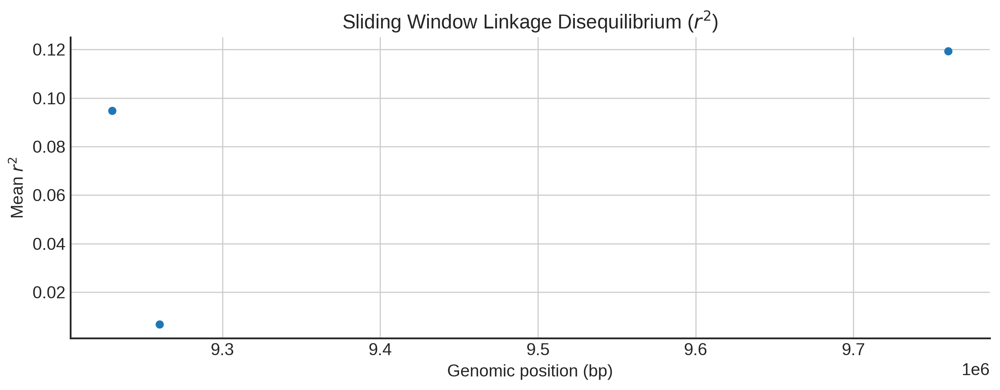

In [353]:
import matplotlib.pyplot as plt

# Midpoint of each window
midpoints = (windows[:, 0] + windows[:, 1]) / 2

# Plot
plt.figure(figsize=(10, 4))
plt.plot(midpoints, r2, marker='o', linestyle='-', linewidth=1.5)
plt.xlabel('Genomic position (bp)', fontsize=12)
plt.ylabel('Mean $r^2$', fontsize=12)
plt.title('Sliding Window Linkage Disequilibrium ($r^2$)', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

In [354]:
genome_size = windows[-1, 1] - windows[0, 0]
print(f"Total genome span: {genome_size:,} bp")

Total genome span: 11,696,832 bp


### diversity measures

#### Theta pi

In [355]:
gt_hd = gt_h.to_genotypes(ploidy=1)

In [356]:
# Theta Pi
## getting a allele count array for the seq. div. function
ac = gt_hd.count_alleles() ## set gt_hd to genotypearray always for this
### Computing mean nucleotide diversity across all sites
pi = allel.sequence_diversity(pos=pos_sorted, ac=ac, start=0, stop=np.max(callset['variants/POS']))
print("Theta pi: ", pi)

Theta pi:  0.009668961975840353


#### Theta Watterson

In [357]:
# Theta Watterson
# Number of segregating sites
is_segregating = ac.is_segregating()
num_segregating_sites = np.sum(is_segregating)
# Calculate Watterson's theta
# Formula: S / a_n where S is num_segregating_sites and a_n is sum of 1/i for i=1 to n-1
n_samples = gt_hd.n_samples
a_n = np.sum([1/i for i in range(1, n_samples)])
theta_w = num_segregating_sites / a_n
print(f"Number of segregating sites: {num_segregating_sites}")
#print(f"Watterson's theta: {theta_w}")

Number of segregating sites: 410117


In [358]:
#sample_names = callset['samples']
#print("Sample names:", sample_names)
#print("Number of samples:", len(sample_names))

In [359]:
#normalization
sequence_length = np.max(pos_sorted) - np.min(pos_sorted) + 1
theta_w_per_site = theta_w / sequence_length
print(f"Watterson's theta per site: {theta_w_per_site}")

Watterson's theta per site: 0.007518913546466763


#### Tajima’s D

In [360]:
# Tajima’s D
tajimas_d = allel.tajima_d(ac, pos=pos_sorted)
print("Tajima’s D:", tajimas_d)

Tajima’s D: 0.7851363109371455


#### Site freq. spectrum

In [361]:
cluster_df = pd.read_csv('haplo_clusters_aman.csv')

sam_cluster = dict(zip(cluster_df['Sample'], cluster_df['Cluster']))

sam_vcf = list(callset['samples'])

In [362]:
cluster_df

,Sample,Cluster
0,FG_001,1
1,FG_002,1
2,FG_003,1
3,FG_004,2
4,FG_005,0
5,FG_006,2
6,FG_007,2
7,FG_008,2
8,FG_009,2
9,FG_010,1


In [363]:
cluster_indices = {0: [], 1: [], 2: []}
for i, sample in enumerate(sam_vcf):
    cluster = sam_cluster.get(sample)
    if cluster is not None:
        cluster_indices[cluster].append(i)

In [364]:
ac0 = gt_hd[:, cluster_indices[0]].count_alleles()
ac1 = gt_hd[:, cluster_indices[1]].count_alleles()
ac2 = gt_hd[:, cluster_indices[2]].count_alleles()

# Count alleles across all samples
ac_all = gt_hd.count_alleles()

af0 = ac0.to_frequencies()[:, 1]
af1 = ac1.to_frequencies()[:, 1]
af2 = ac2.to_frequencies()[:, 1]

In [365]:
n = 60 #no.of samples in vcf
sfs = allel.sfs_folded(ac_all, n=n)
print(f"SFS shape: {sfs.shape}")
print(f"SFS content: {sfs}")

SFS shape: (31,)
SFS content: [48482 79934 57867 41056 34118 30152 27375 24954 21974 19449 17052 14921
 12815 10530  7679  5210  2963  1378   483   155    43     6     3     0
     0     0     0     0     0     0     0]


<Axes: xlabel='minor allele count', ylabel='site frequency'>

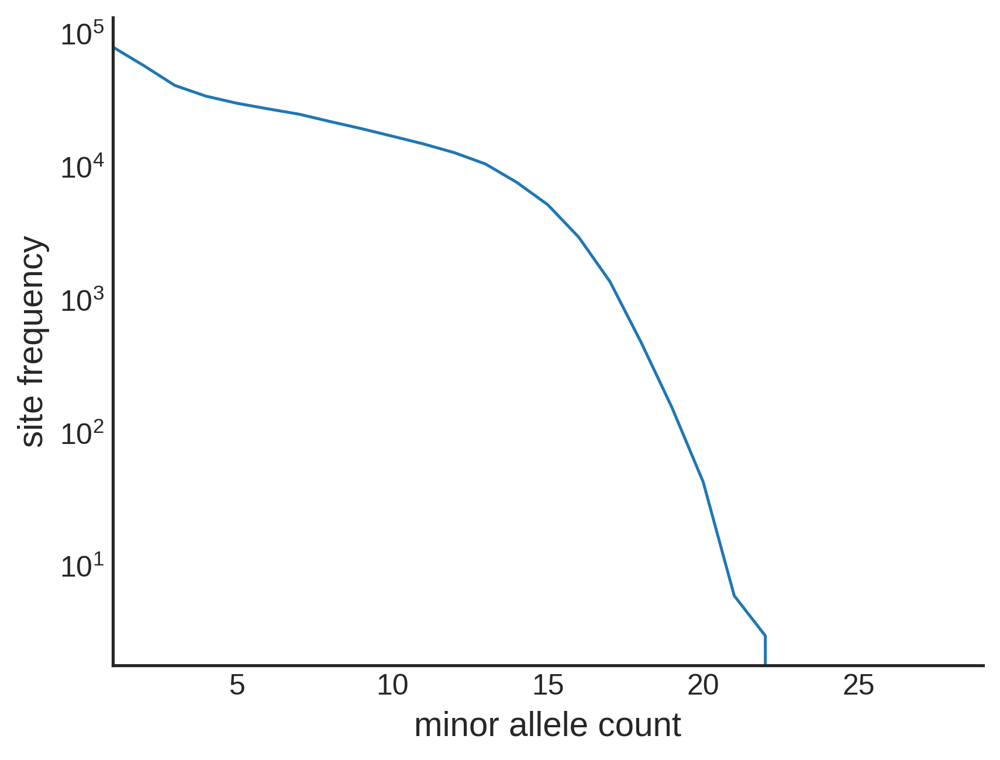

In [366]:
allel.plot_sfs_folded(sfs)

In [367]:
#ac_all

In [368]:
dac = np.zeros(len(gt_hd), dtype=int)
print(len(dac))

458599


In [369]:
for i, j in enumerate(gt_hd):
    if np.all(j == 0): #when ref. is smtg, count the alternate. Here ref. is zero, so count 1, which is thealternate allele
        dac[i] = ac_all[i, 1]
    else:
        dac[i] = ac_all[i, 0]

In [370]:
sfs_normal = allel.sfs(dac, n=n)

<Axes: xlabel='derived allele count', ylabel='site frequency'>

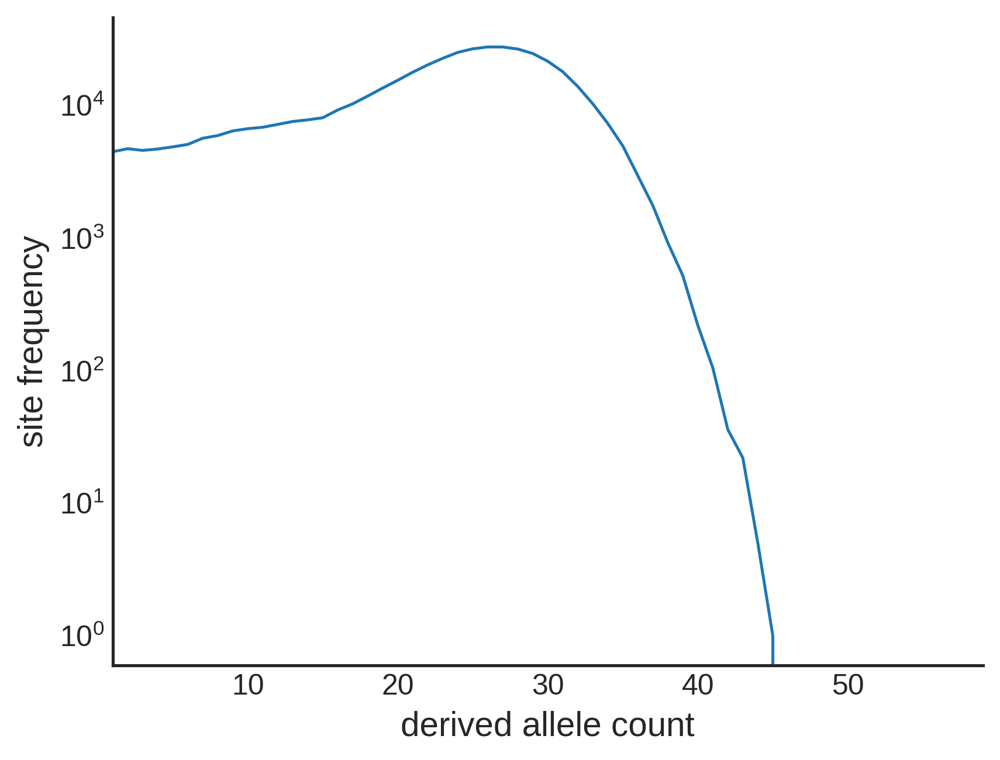

In [371]:
allel.plot_sfs(sfs_normal)

#### FST

In [372]:
#print(cluster_indices)

In [373]:
#print(af0, af1, af2)
import pandas as pd

df = pd.DataFrame({
    'Cluster_0': af0,
    'Cluster_1': af1,
    'Cluster_2': af2
})
#print(df.head(10))

In [374]:
#print(f"Remaining SNPs after filtering: {len(ac0_high)}")

weir_cockerham FST

In [375]:
clust_subpop = [cluster_indices[0], cluster_indices[1], cluster_indices[2]]

In [376]:
a, b, c = allel.weir_cockerham_fst(gt, clust_subpop)

/data/proj2/home/students/a.nalakath/.conda/envs/scikit_aman/lib/python3.10/site-packages/allel/stats/fst.py:184: RuntimeWarning: invalid value encountered in divide
  p = ac / an[:, np.newaxis, :]
/data/proj2/home/students/a.nalakath/.conda/envs/scikit_aman/lib/python3.10/site-packages/allel/stats/fst.py:225: RuntimeWarning: divide by zero encountered in divide
  a = ((n_bar / n_C) *
/data/proj2/home/students/a.nalakath/.conda/envs/scikit_aman/lib/python3.10/site-packages/allel/stats/fst.py:227: RuntimeWarning: divide by zero encountered in divide
  ((1 / (n_bar - 1)) *
/data/proj2/home/students/a.nalakath/.conda/envs/scikit_aman/lib/python3.10/site-packages/allel/stats/fst.py:234: RuntimeWarning: divide by zero encountered in divide
  b = ((n_bar / (n_bar - 1)) *
/data/proj2/home/students/a.nalakath/.conda/envs/scikit_aman/lib/python3.10/site-packages/allel/stats/fst.py:225: RuntimeWarning: invalid value encountered in multiply
  a = ((n_bar / n_C) *
/data/proj2/home/students/a.nalak

In [377]:
fst = a / (a + b + c)
#fst

/tmp/ipykernel_1229973/1218127604.py:1: RuntimeWarning: invalid value encountered in add
  fst = a / (a + b + c)
/tmp/ipykernel_1229973/1218127604.py:1: RuntimeWarning: invalid value encountered in divide
  fst = a / (a + b + c)


In [378]:
fst = (np.sum(a, axis=1) / (np.sum(a, axis=1) + np.sum(b, axis=1) + np.sum(c, axis=1)))
#fst

/tmp/ipykernel_1229973/3679179795.py:1: RuntimeWarning: invalid value encountered in add
  fst = (np.sum(a, axis=1) / (np.sum(a, axis=1) + np.sum(b, axis=1) + np.sum(c, axis=1)))
/tmp/ipykernel_1229973/3679179795.py:1: RuntimeWarning: invalid value encountered in divide
  fst = (np.sum(a, axis=1) / (np.sum(a, axis=1) + np.sum(b, axis=1) + np.sum(c, axis=1)))


Hudson FST

In [379]:
# 1 vs 2
num, den = allel.hudson_fst(ac0, ac1)

valid = (~np.isnan(num)) & (~np.isnan(den)) & (den != 0)
fst = np.sum(num[valid]) / np.sum(den[valid])
print(fst)

0.4845332529888902


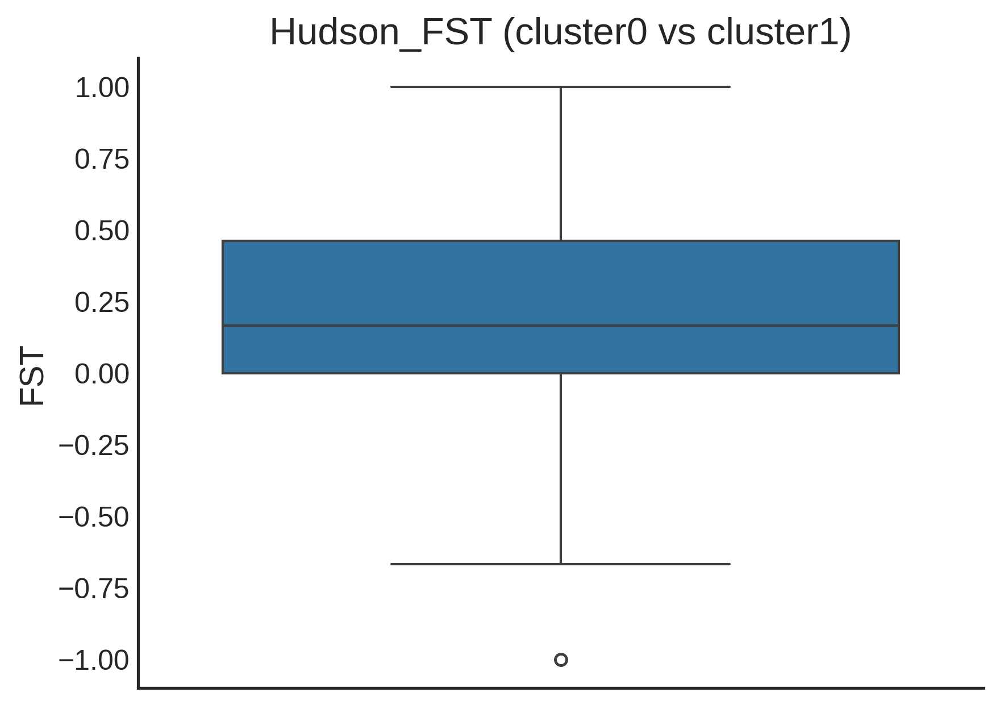

In [380]:
import matplotlib.pyplot as plt
import seaborn as sns

# 0 vs 1
num, den = allel.hudson_fst(ac0, ac1)
valid = (~np.isnan(num)) & (~np.isnan(den)) & (den != 0)
fst_per_snp = num[valid] / den[valid]

sns.boxplot(y=fst_per_snp)
plt.title('Hudson_FST (cluster0 vs cluster1)')
plt.ylabel('FST')
plt.show()

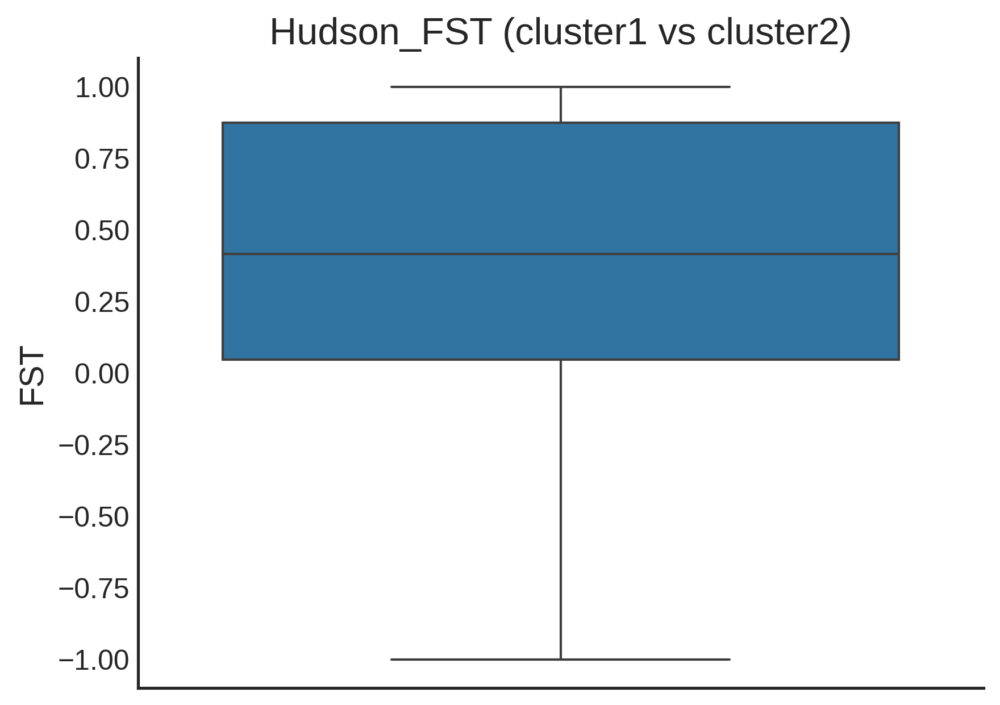

In [381]:
# 1 vs 2
num, den = allel.hudson_fst(ac1, ac2)
valid = (~np.isnan(num)) & (~np.isnan(den)) & (den != 0)
fst_per_snp = num[valid] / den[valid]

sns.boxplot(y=fst_per_snp)
plt.title('Hudson_FST (cluster1 vs cluster2)')
plt.ylabel('FST')
plt.show()

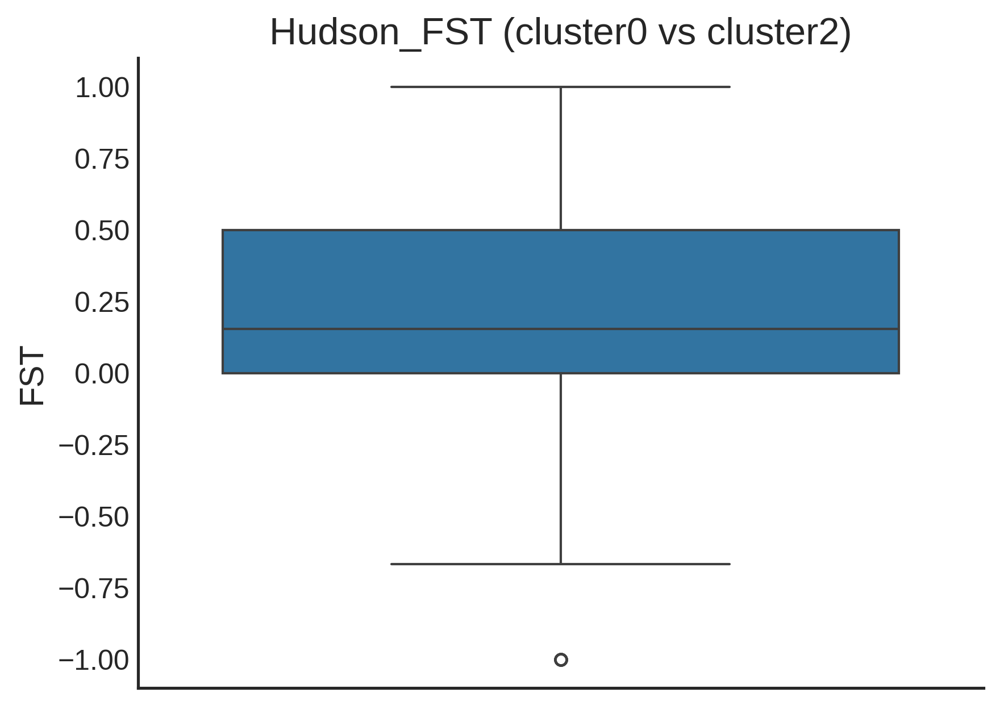

In [382]:
# 1 vs 2
num, den = allel.hudson_fst(ac0, ac2)
valid = (~np.isnan(num)) & (~np.isnan(den)) & (den != 0)
fst_per_snp = num[valid] / den[valid]

sns.boxplot(y=fst_per_snp)
plt.title('Hudson_FST (cluster0 vs cluster2)')
plt.ylabel('FST')
plt.show()

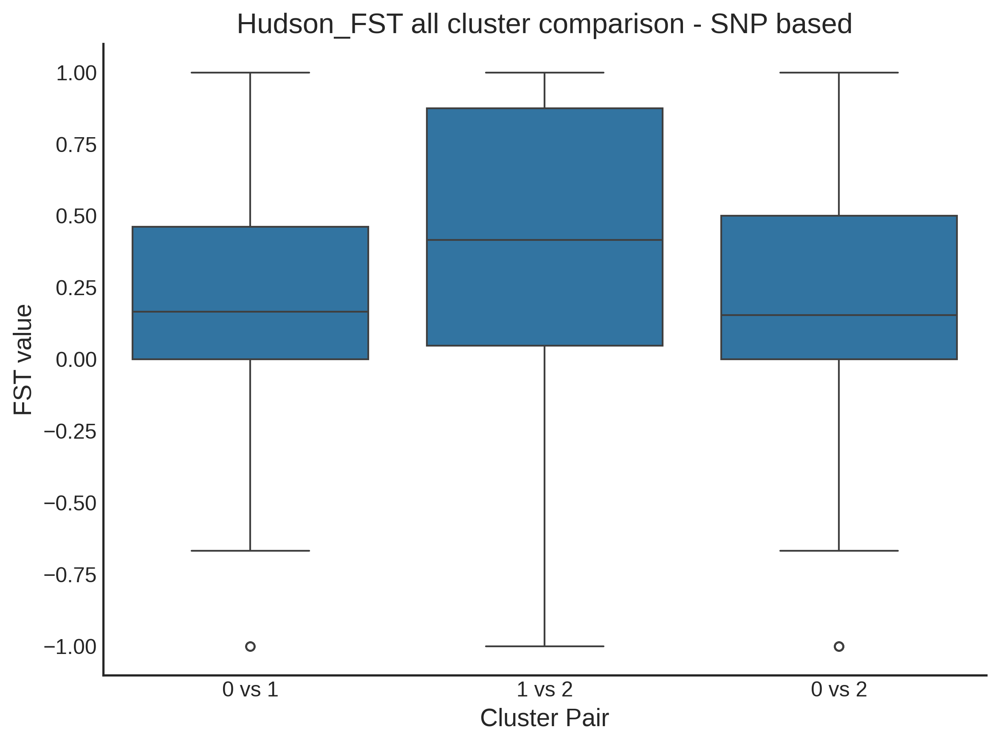

In [383]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 0 vs 1
num01, den01 = allel.hudson_fst(ac0, ac1)
valid01 = (~np.isnan(num01)) & (~np.isnan(den01)) & (den01 != 0)
fst_01 = num01[valid01] / den01[valid01]

# 1 vs 2
num12, den12 = allel.hudson_fst(ac1, ac2)
valid12 = (~np.isnan(num12)) & (~np.isnan(den12)) & (den12 != 0)
fst_12 = num12[valid12] / den12[valid12]

# 0 vs 2
num02, den02 = allel.hudson_fst(ac0, ac2)
valid02 = (~np.isnan(num02)) & (~np.isnan(den02)) & (den02 != 0)
fst_02 = num02[valid02] / den02[valid02]

# Combine into DataFrame
df = pd.DataFrame({
    'FST': np.concatenate([fst_01, fst_12, fst_02]),
    'Comparison': (['0 vs 1'] * len(fst_01)) +
                  (['1 vs 2'] * len(fst_12)) +
                  (['0 vs 2'] * len(fst_02))
})

# Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Comparison', y='FST', data=df)
plt.title('Hudson_FST all cluster comparison - SNP based')
plt.xlabel('Cluster Pair')
plt.ylabel('FST value')
plt.tight_layout()
plt.show()


In [385]:
# 2 vs 3
num, den = allel.hudson_fst(ac1, ac2)

#fst = num / den
#fst

valid = (~np.isnan(num)) & (~np.isnan(den)) & (den != 0)
fst = np.sum(num[valid]) / np.sum(den[valid])
print(fst)

0.6793129980995178


In [386]:
# 1 vs 3
num, den = allel.hudson_fst(ac0, ac2)

#fst = num / den
#fst

valid = (~np.isnan(num)) & (~np.isnan(den)) & (den != 0)
fst = np.sum(num[valid]) / np.sum(den[valid])
print(fst)

0.49770820291787377


Patterson FST

In [387]:
# same ordering as hudson fst
num_first , den_first  = allel.patterson_fst(ac0, ac1)
num_second , den_second  = allel.patterson_fst(ac1, ac2)
num_third , den_third  = allel.patterson_fst(ac0, ac2)

/data/proj2/home/students/a.nalakath/.conda/envs/scikit_aman/lib/python3.10/site-packages/allel/stats/admixture.py:38: RuntimeWarning: invalid value encountered in divide
  x = (ac[:, 0] * ac[:, 1]) / (an * (an - 1))


In [388]:
valid = (~np.isnan(num_first)) & (~np.isnan(den_first)) & (den != 0)
fst_first = np.sum(num_first[valid]) / np.sum(den_first[valid])
print(fst_first)

0.433459025357577


In [389]:
valid = (~np.isnan(num_second)) & (~np.isnan(den_second)) & (den != 0)
fst_second = np.sum(num_second[valid]) / np.sum(den_second[valid])
print(fst_second)

0.6753339109676312


In [390]:
valid = (~np.isnan(num_third)) & (~np.isnan(den_third)) & (den != 0)
fst_third = np.sum(num_third[valid]) / np.sum(den_third[valid])
print(fst_third)

0.4977082029178739


#### Moving hudson FST

In [391]:
size = 20000
avgfst_first  = allel.moving_hudson_fst(ac0, ac1, size, step=size//2)
avgfst_second  = allel.moving_hudson_fst(ac1, ac2, size, step=size//2)
avgfst_third  = allel.moving_hudson_fst(ac0, ac2, size, step=size//2)

In [392]:
print(avgfst_first)
print(avgfst_second)
print(avgfst_third)

[0.50909808 0.52971791 0.54778265 0.44751385 0.46586752 0.47525963
 0.47673392 0.62124729 0.63372873 0.62094544 0.59704139 0.50432626
 0.52967783 0.48147363 0.41381534 0.45767921 0.54830321 0.5366645
 0.43025864 0.42725272 0.44389346 0.40392923 0.46660139 0.47343571
 0.41843278 0.45879129 0.47028167 0.42927835 0.42411117 0.49952222
 0.55999715 0.55454133 0.49043213 0.39031687 0.41394652 0.3992343
 0.39027785 0.44823898 0.48952302 0.42359931 0.3723993  0.48770007
 0.51956645 0.46628359]
[0.67094649 0.75312446 0.82341346 0.68969098 0.62369503 0.63493063
 0.60073087 0.74366524 0.76571327 0.71209499 0.7171075  0.71106022
 0.75012701 0.70725604 0.5386929  0.52906846 0.64504122 0.7476422
 0.70100316 0.67782304 0.66216303 0.59184645 0.59293018 0.62539185
 0.5703427  0.61566868 0.67065026 0.59581043 0.68361607 0.77048012
 0.7768195  0.73520527 0.71574709 0.61540344 0.57078617 0.60423524
 0.59076    0.7348261  0.79866471 0.6460896  0.51126557 0.670676
 0.75227839 0.61651669]
[0.42718777 0.60002

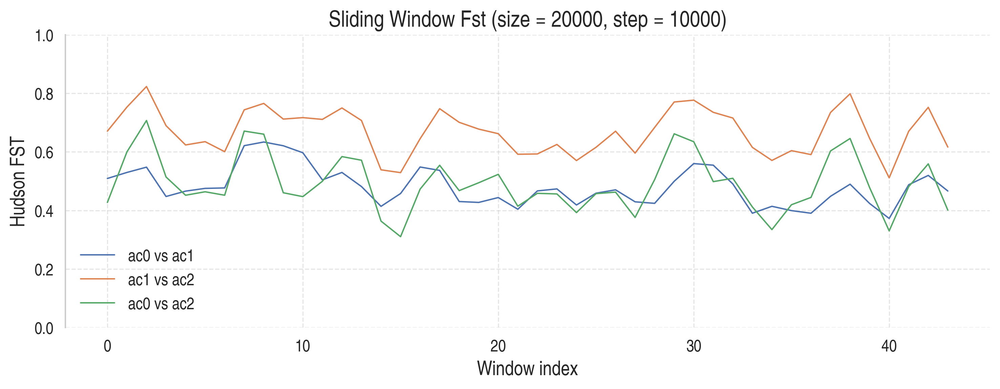

In [393]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.font_manager as fm

# Use Montserrat
mont_font = fm.FontProperties(fname='/usr/share/fonts/tex-gyre/texgyreheroscn-regular.otf')


# Set seaborn style
colors = sns.color_palette('deep')[:3]
sns.set_context("paper")
sns.set_style("whitegrid")

# Apply font globally
plt.rcParams.update({
    'font.family': mont_font.get_name(),
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'axes.spines.right': False,
    'axes.spines.top': False,
})

# Data
x = np.arange(len(avgfst_first))

# Plot
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(x, avgfst_first, label='ac0 vs ac1', linewidth=1, color=colors[0])
ax.plot(x, avgfst_second, label='ac1 vs ac2', linewidth=1, color=colors[1])
ax.plot(x, avgfst_third, label='ac0 vs ac2', linewidth=1, color=colors[2])

ax.set_xlabel('Window index')
ax.set_ylabel('Hudson FST')
ax.set_title('Sliding Window Fst (size = 20000, step = 10000)')
ax.legend(frameon=False)
ax.grid(True, linestyle='--', alpha=0.5)
ax.set_ylim(0, 1)
ax.spines['bottom'].set_visible(False)

plt.tight_layout()
# plt.savefig("fst_montserrat_style.pdf", dpi=600)
plt.show()

In [394]:
size = 20000
step = size // 2

fst1, windows1, counts1 = allel.windowed_hudson_fst(pos_sorted, ac0, ac1, size=size, step=step)
fst2, windows2, counts2 = allel.windowed_hudson_fst(pos_sorted, ac1, ac2, size=size, step=step)
fst3, windows3, counts3 = allel.windowed_hudson_fst(pos_sorted, ac0, ac2, size=size, step=step)

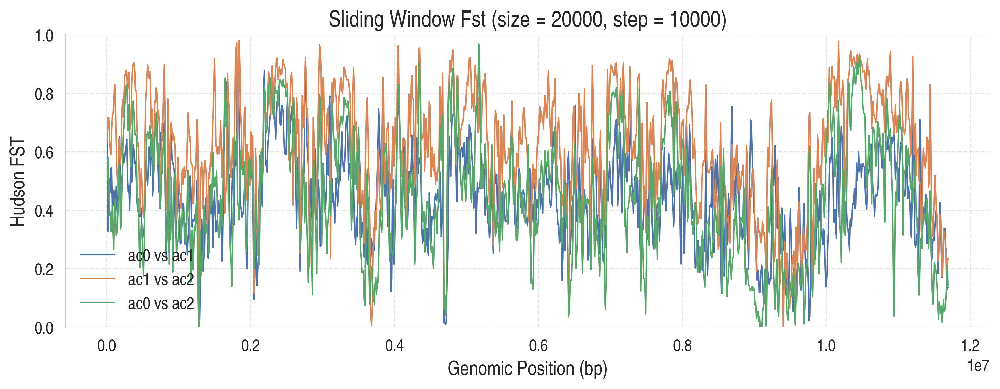

In [395]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.font_manager as fm

# Use Montserrat (or fallback to TexGyre Heros CN)
mont_font = fm.FontProperties(fname='/usr/share/fonts/tex-gyre/texgyreheroscn-regular.otf')

# Set seaborn style
colors = sns.color_palette('deep')[:3]
sns.set_context("paper")
sns.set_style("whitegrid")

# Apply font globally
plt.rcParams.update({
    'font.family': mont_font.get_name(),
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'axes.spines.right': False,
    'axes.spines.top': False,
})

# Compute window midpoints
x1 = windows1.mean(axis=1)
x2 = windows2.mean(axis=1)
x3 = windows3.mean(axis=1)

# Plot
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(x1, fst1, label='ac0 vs ac1', linewidth=1, color=colors[0])
ax.plot(x2, fst2, label='ac1 vs ac2', linewidth=1, color=colors[1])
ax.plot(x3, fst3, label='ac0 vs ac2', linewidth=1, color=colors[2])

ax.set_xlabel('Genomic Position (bp)')
ax.set_ylabel('Hudson FST')
ax.set_title('Sliding Window Fst (size = 20000, step = 10000)')
ax.legend(frameon=False)
ax.grid(True, linestyle='--', alpha=0.5)
ax.set_ylim(0, 1)
ax.spines['bottom'].set_visible(False)

plt.tight_layout()
# plt.savefig("fst_genome_position.pdf", dpi=600)
plt.show()

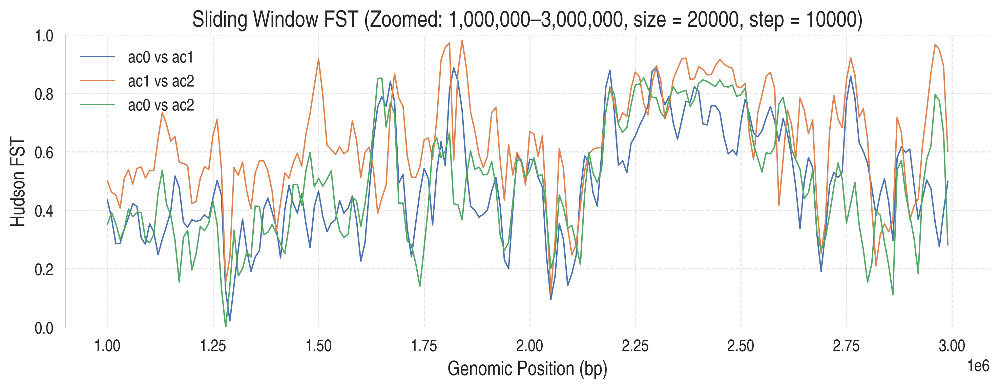

In [396]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.font_manager as fm

# Font setup
mont_font = fm.FontProperties(fname='/usr/share/fonts/tex-gyre/texgyreheroscn-regular.otf')

# Seaborn style
colors = sns.color_palette('deep')[:3]
sns.set_context("paper")
sns.set_style("whitegrid")

# Global font settings
plt.rcParams.update({
    'font.family': mont_font.get_name(),
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300,
    'axes.spines.right': False,
    'axes.spines.top': False,
})

# Window midpoints
x1 = windows1.mean(axis=1)
x2 = windows2.mean(axis=1)
x3 = windows3.mean(axis=1)

# Define zoom range
start = 1000000
end = 3000000

# Apply mask
mask1 = (x1 >= start) & (x1 <= end)
mask2 = (x2 >= start) & (x2 <= end)
mask3 = (x3 >= start) & (x3 <= end)

# Plot
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(x1[mask1], fst1[mask1], label='ac0 vs ac1', linewidth=1, color=colors[0])
ax.plot(x2[mask2], fst2[mask2], label='ac1 vs ac2', linewidth=1, color=colors[1])
ax.plot(x3[mask3], fst3[mask3], label='ac0 vs ac2', linewidth=1, color=colors[2])

ax.set_xlabel('Genomic Position (bp)')
ax.set_ylabel('Hudson FST')
ax.set_title(f'Sliding Window FST (Zoomed: {start:,}–{end:,}, size = 20000, step = 10000)')
ax.legend(frameon=False)
ax.grid(True, linestyle='--', alpha=0.5)
ax.set_ylim(0, 1)
ax.spines['bottom'].set_visible(False)

plt.tight_layout()
# plt.savefig("fst_genome_zoomed.pdf", dpi=600)
plt.show()

#### Admixture

In [397]:
T, B = allel.patterson_f3(ac0, ac1, ac2)

In [398]:
valid = (~np.isnan(T)) & (~np.isnan(B)) & (B != 0)
f3_stat = np.sum(T[valid]) / np.sum(B[valid])
f3_stat

np.float64(0.13930508613687542)

#### Haplotype diversity

In [399]:
#hd = allel.moving_haplotype_diversity(h, size, start=0, stop=None, step=None)

In [400]:
gt_h

<HaplotypeArray shape=(458599, 60) dtype=int8>
. . . 1 1 ... 1 . . . 1
1 1 1 . 1 ... . . . . .
1 . . 0 . ... . . . . 0
...
1 . . . 0 ... 0 . . 0 .
. 1 . . 0 ... . 0 . . .
1 . . 0 . ... 0 0 . 0 1

In [401]:
size = 300
hd = allel.moving_haplotype_diversity(gt_h, size, start=0, stop=None, step=None)
#hd

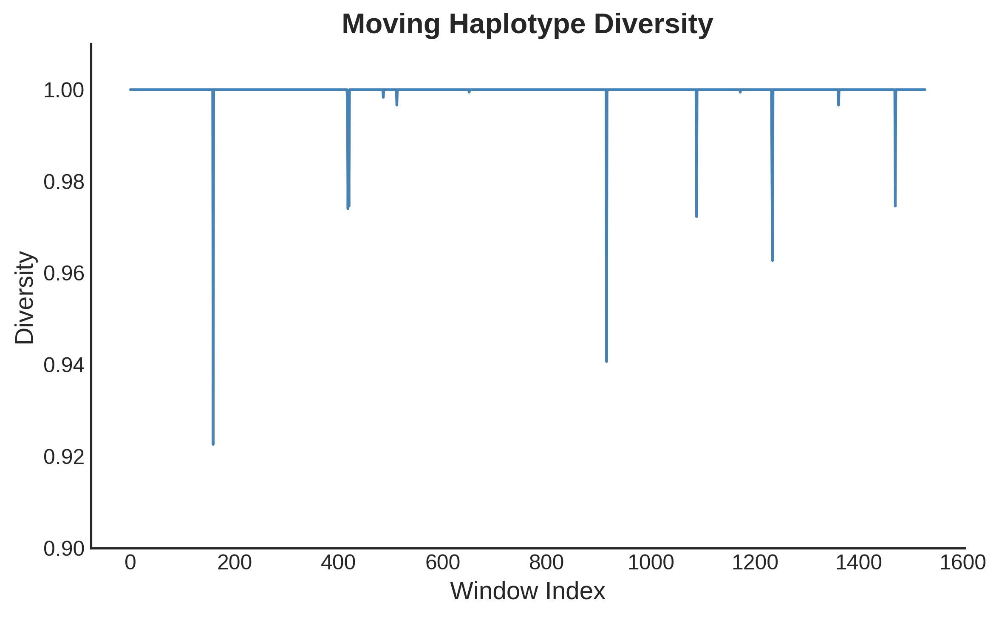

In [403]:
import matplotlib.pyplot as plt

# Use clean white style
plt.style.use('seaborn-v0_8-white')

# Create plot
plt.figure(figsize=(8, 5), dpi=300)
plt.plot(hd, linewidth=1.5, color='steelblue')

# Titles and labels
plt.title('Moving Haplotype Diversity', fontsize=16, fontweight='semibold')
plt.xlabel('Window Index', fontsize=14)
plt.ylabel('Diversity', fontsize=14)

# Disable grid
plt.grid(False)

# Ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Axes limits
plt.ylim(0.9, 1.01)

# Optimize layout
plt.tight_layout()
plt.show()

In [404]:
#pos_sorted

In [406]:
pos = callset['variants/POS']

<Axes: xlabel='position (bp)', ylabel='haplotype count'>

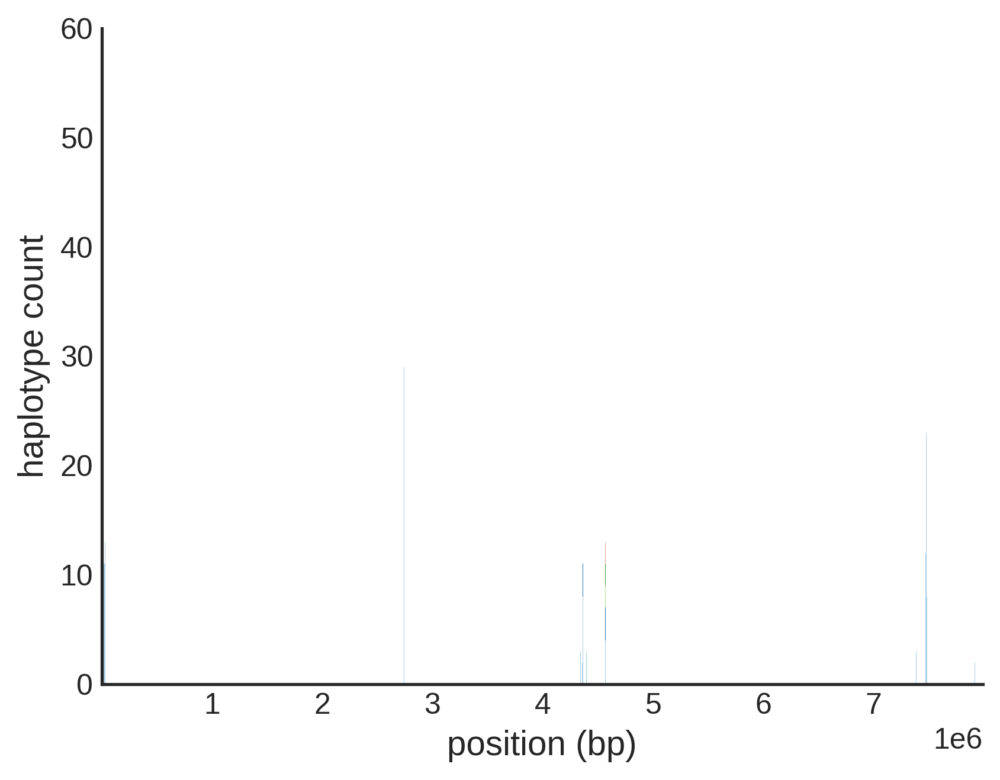

In [407]:
allel.plot_moving_haplotype_frequencies(
    pos=pos,
    h=gt_h,
    size=100,
    start=0,
    stop=None,
    n=None,
    palette='Paired',
    singleton_color='w',
    ax=None
)
# bp in 1e6 = 1,000,000

#### iHS score

In [408]:
#allel.ihs(h, pos, map_pos=None, min_ehh=0.05, min_maf=0.05, include_edges=False, gap_scale=20000, max_gap=200000, is_accessible=None, use_threads=True)

In [409]:
ac_haplo = gt_h.count_alleles()
maf_filter = ac_haplo.min(axis=1) / ac_haplo.sum(axis=1) >= 0.05  # MAF ≥ 5%

/tmp/ipykernel_1229973/1485808121.py:2: RuntimeWarning: invalid value encountered in divide
  maf_filter = ac_haplo.min(axis=1) / ac_haplo.sum(axis=1) >= 0.05  # MAF ≥ 5%


In [410]:
gt_h_filt = gt_h.compress(maf_filter, axis=0)
pos_filt = pos[maf_filter]

In [411]:
ihs_score = allel.ihs(
    gt_h_filt,
    pos_filt,
    min_ehh=0.05,
    min_maf=0.05,
    include_edges=False,
    gap_scale=20000,
    max_gap=200000,
    use_threads=True
)

In [412]:
#ihs_score

In [413]:
ac_haplo_filt = ac_haplo[maf_filter]
aac = ac_haplo_filt[:, 1]

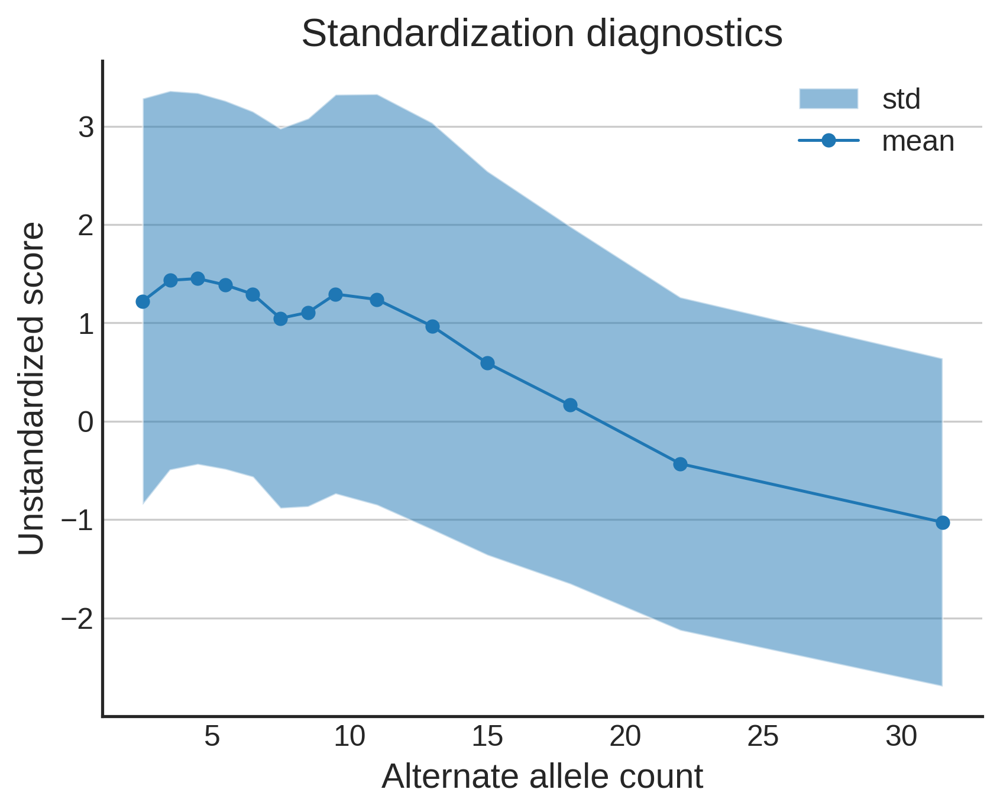

In [414]:
standard_ihs_score, bins_used = allel.standardize_by_allele_count(ihs_score, aac, bins=None, n_bins=None, diagnostics=True)

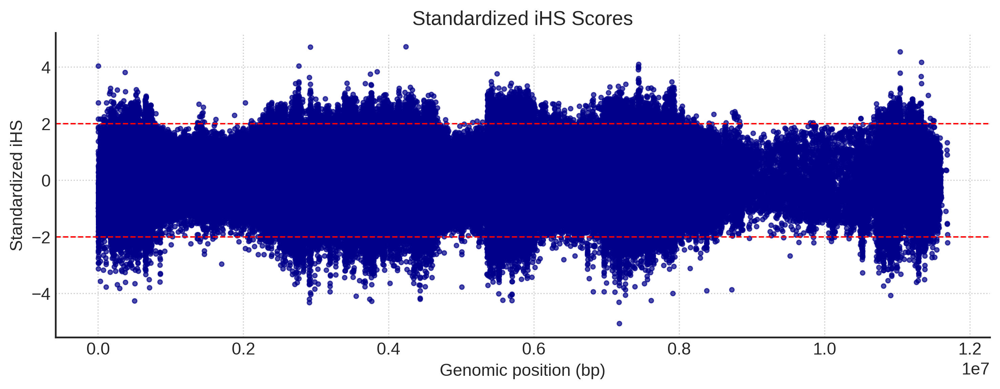

In [415]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.scatter(pos_filt, standard_ihs_score, s=10, alpha=0.7, color='darkblue')
plt.axhline(2, color='red', linestyle='--', linewidth=1)
plt.axhline(-2, color='red', linestyle='--', linewidth=1)
plt.xlabel('Genomic position (bp)', fontsize=12)
plt.ylabel('Standardized iHS', fontsize=12)
plt.title('Standardized iHS Scores', fontsize=14)
plt.grid(True, linestyle=':')
plt.tight_layout()
plt.show()

----

In [416]:
# moving statistic

In [417]:
chroms = np.array(callset['variants/CHROM'])
#chroms

In [418]:
# allele count for each clus
ac0 = gn0.count_alleles()
ac1 = gn1.count_alleles()
ac2 = gn2.count_alleles()

In [419]:
from collections import defaultdict
import numpy as np

window_size = 10000
step = 5000
grouped_pi = defaultdict(list)

cluster_ids = [0, 1, 2]
acs = [ac0, ac1, ac2]

for cl, ac in zip(cluster_ids, acs):
    for chrom in np.unique(chroms):
        mask = (chroms == chrom)
        pos_sub = pos_sorted[mask]
        ac_sub = ac[mask]

        if len(pos_sub) < 2:
            continue

        try:
            pi_vals, _, _, _ = allel.windowed_diversity(pos_sub, ac_sub, size=window_size, step=step)
        except:
            continue

        grouped_pi[f"Cluster {cl} - {chrom}"].extend(pi_vals[~np.isnan(pi_vals)])


<Figure size 6000x1800 with 0 Axes>

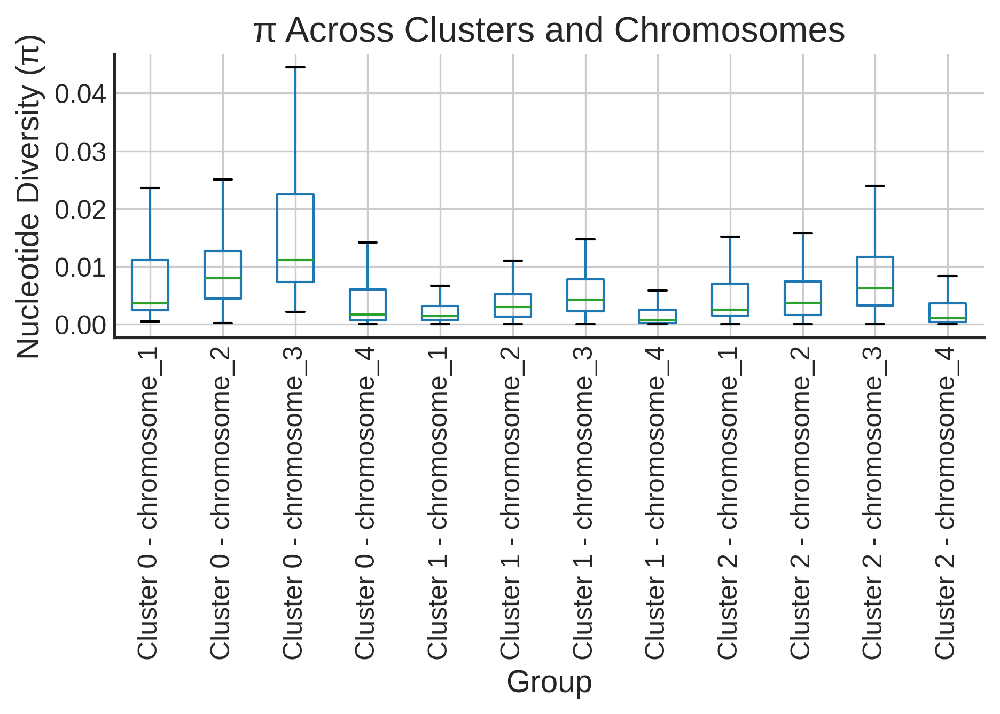

In [420]:
import pandas as pd
import matplotlib.pyplot as plt

flat_data = [(label, val) for label, values in grouped_pi.items() for val in values]
df = pd.DataFrame(flat_data, columns=["Group", "Theta_pi"])

plt.figure(figsize=(20, 6))
df.boxplot(column="Theta_pi", by="Group", rot=90, showfliers=False)
plt.ylabel("Nucleotide Diversity (π)")
plt.title("π Across Clusters and Chromosomes")
plt.suptitle("")
plt.tight_layout()
plt.show()

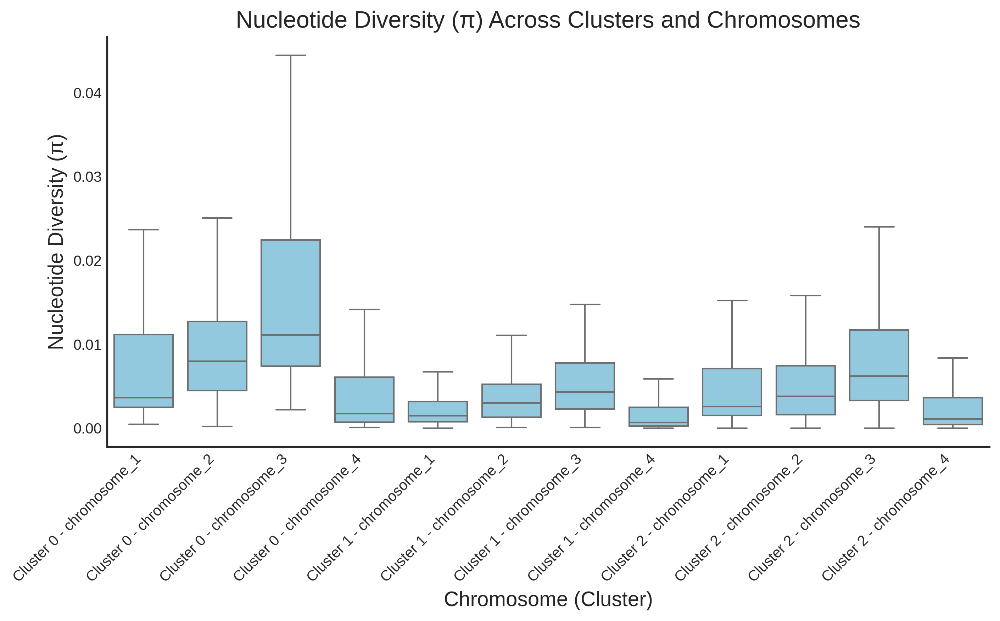

In [421]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert 'Group' to categorical with sorted order for consistency
df["Group"] = pd.Categorical(df["Group"], categories=sorted(df["Group"].unique()), ordered=True)

plt.figure(figsize=(len(df["Group"].unique()) * 0.8, 6))
sns.boxplot(data=df, x="Group", y="Theta_pi", color="skyblue", showfliers=False, linewidth=1)

plt.ylabel("Nucleotide Diversity (π)", fontsize=14)
plt.xlabel("Chromosome (Cluster)", fontsize=14)
plt.title("Nucleotide Diversity (π) Across Clusters and Chromosomes", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
sns.despine()

plt.tight_layout()
plt.show()

In [422]:
# line plot

In [423]:
pi_lines = {}
pos_lines = {}

for cl, ac in zip(cluster_ids, acs):
    try:
        pi_vals, windows, _, _ = allel.windowed_diversity(
            pos_sorted, ac, size=window_size, step=step
        )
        midpoints = windows.mean(axis=1)
        pi_lines[f"Cluster {cl}"] = pi_vals
        pos_lines[f"Cluster {cl}"] = midpoints
    except:
        continue

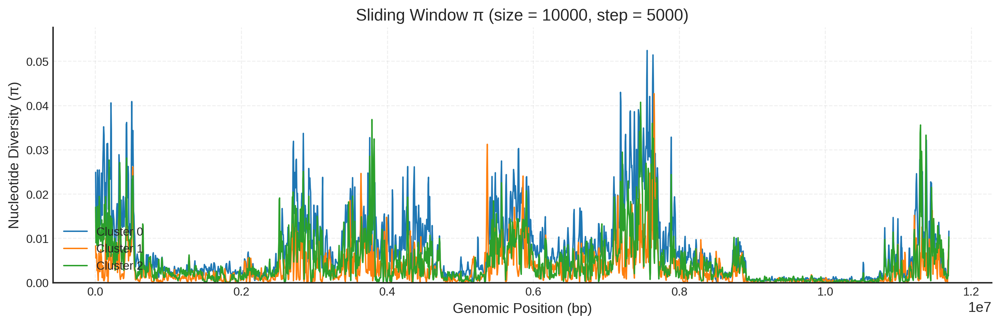

In [424]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

for label in pi_lines:
    plt.plot(pos_lines[label], pi_lines[label], label=label, linewidth=1.2)

plt.xlabel("Genomic Position (bp)", fontsize=12)
plt.ylabel("Nucleotide Diversity (π)", fontsize=12)
plt.title(f"Sliding Window π (size = {window_size}, step = {step})", fontsize=14)
plt.ylim(0, np.nanmax([v for v in pi_lines.values()]) * 1.1)
plt.legend(loc="lower left", frameon=False, fontsize=10)
plt.grid(True, linestyle='--', alpha=0.3)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

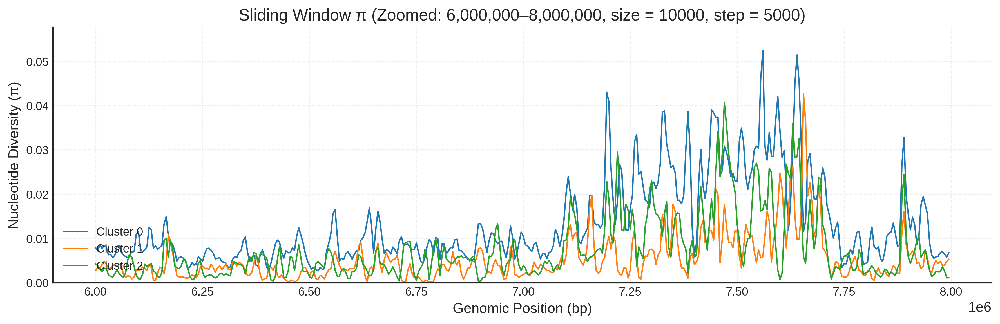

In [425]:
import matplotlib.pyplot as plt
import numpy as np

# Define zoom range
start = 6_000_000
end = 8_000_000

# Plot
plt.figure(figsize=(12, 4))

for label in pi_lines:
    pos = pos_lines[label]
    vals = pi_lines[label]
    
    mask = (pos >= start) & (pos <= end)
    plt.plot(pos[mask], vals[mask], label=label, linewidth=1.2)

plt.xlabel("Genomic Position (bp)", fontsize=12)
plt.ylabel("Nucleotide Diversity (π)", fontsize=12)
plt.title(f"Sliding Window π (Zoomed: {start:,}–{end:,}, size = {window_size}, step = {step})", fontsize=14)
plt.ylim(0, np.nanmax([v for v in pi_lines.values()]) * 1.1)
plt.legend(loc="lower left", frameon=False, fontsize=10)
plt.grid(True, linestyle='--', alpha=0.3)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

---

In [426]:
# tajimas d

In [427]:
import allel
import numpy as np
import matplotlib.pyplot as plt

# Define window parameters
window_size = 20000
step = 10000

# Pre-allocate
tajima_lines = {}
pos_lines = {}

# Cluster-wise Tajima’s D
for cl, ac_sub in zip(cluster_ids, acs):
    try:
        d_vals, windows, _ = allel.windowed_tajima_d(
            pos_sorted, ac_sub, size=window_size, step=step
        )
        midpoints = windows.mean(axis=1)
        tajima_lines[f"Cluster {cl}"] = d_vals
        pos_lines[f"Cluster {cl}"] = midpoints
    except:
        continue

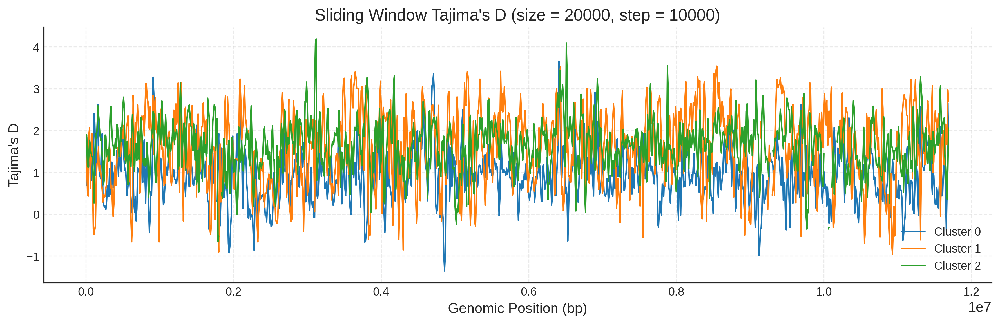

In [428]:
plt.figure(figsize=(12, 4))

for label in tajima_lines:
    plt.plot(pos_lines[label], tajima_lines[label], label=label, linewidth=1.2)

plt.xlabel("Genomic Position (bp)", fontsize=12)
plt.ylabel("Tajima's D", fontsize=12)
plt.title(f"Sliding Window Tajima's D (size = {window_size}, step = {step})", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(loc="lower right", frameon=False, fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

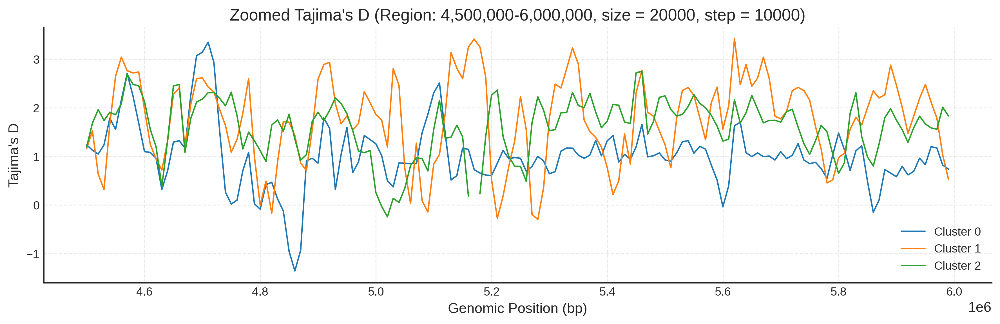

In [429]:
# Define zoom range
start = 4_500_000
end = 6_000_000

plt.figure(figsize=(12, 4))

for label in tajima_lines:
    pos = pos_lines[label]
    vals = tajima_lines[label]
    mask = (pos >= start) & (pos <= end)
    plt.plot(pos[mask], vals[mask], label=label, linewidth=1.2)

plt.xlabel("Genomic Position (bp)", fontsize=12)
plt.ylabel("Tajima's D", fontsize=12)
plt.title(f"Zoomed Tajima's D (Region: {start:,}-{end:,}, size = {window_size}, step = {step})", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(loc="lower right", frameon=False, fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

---

In [430]:
chroms = callset['variants/CHROM']
positions = callset['variants/POS']

In [431]:
import pandas as pd

df = pd.DataFrame({'chrom': chroms, 'pos': positions})
chrom_lengths = df.groupby('chrom')['pos'].max().sort_values(ascending=False)
print(chrom_lengths)

chrom
chromosome_1    11696846
chromosome_2     8913983
chromosome_4     8031430
chromosome_3     7712921
Name: pos, dtype: int32


In [432]:
# theta watterson

def sliding_theta_watterson(pos, ac, window_size, step):
    windows = np.arange(pos.min(), pos.max(), step)
    theta_vals = []

    for w_start in windows:
        w_end = w_start + window_size
        mask = (pos >= w_start) & (pos < w_end)
        ac_sub = ac.compress(mask, axis=0)

        if ac_sub.shape[0] == 0 or ac_sub.shape[1] < 2:
            theta_vals.append(0)
            continue

        is_segregating = ac_sub.is_segregating()
        S = np.sum(is_segregating)
        n = ac_sub.shape[1]

        a_n = np.sum([1.0 / i for i in range(1, n)])
        theta = (S / a_n) / window_size  # <-- Normalized θ per bp
        theta_vals.append(theta)

    return np.array(theta_vals)

In [433]:
acs = [gn0.count_alleles(), gn1.count_alleles(), gn2.count_alleles()]
cluster_ids = [0, 1, 2]

grouped_theta = defaultdict(list)
window_size = 10000
step = 5000

for cl, ac in zip(cluster_ids, acs):
    for chrom in np.unique(chroms):
        mask = (chroms == chrom)
        pos_sub = pos_sorted[mask]
        ac_sub = ac[mask]

        if len(pos_sub) < 2 or ac_sub.shape[1] < 2:
            continue

        theta_vals = sliding_theta_watterson(pos_sub, ac_sub, window_size, step)
        theta_vals = [v for v in theta_vals if not np.isnan(v)]
        grouped_theta[f"Cluster {cl} - {chrom}"].extend(theta_vals)


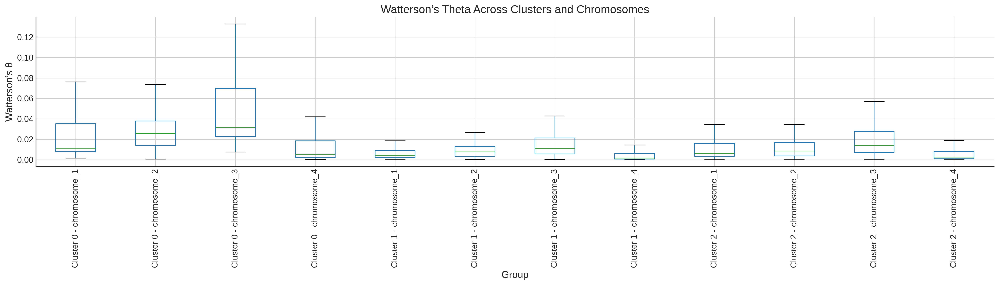

In [434]:
flat_data = [(label, val) for label, vals in grouped_theta.items() for val in vals]
df = pd.DataFrame(flat_data, columns=["Group", "Theta_W"])

fig, ax = plt.subplots(figsize=(20, 6))
df.boxplot(column="Theta_W", by="Group", rot=90, showfliers=False, ax=ax)
ax.set_ylabel("Watterson’s θ")
plt.title("Watterson’s Theta Across Clusters and Chromosomes")
plt.suptitle("")
plt.tight_layout()
plt.show()

In [435]:
theta_lines = {}
pos_lines = {}

for cl, ac in zip(cluster_ids, acs):
    try:
        mask_valid = ac.shape[1] >= 2
        if not mask_valid:
            continue
        pos_sub = pos_sorted
        theta_vals = sliding_theta_watterson(pos_sub, ac, window_size, step)
        windows = np.arange(pos_sub.min(), pos_sub.max(), step)
        midpoints = windows + window_size // 2

        theta_lines[f"Cluster {cl}"] = theta_vals
        pos_lines[f"Cluster {cl}"] = midpoints
    except:
        continue

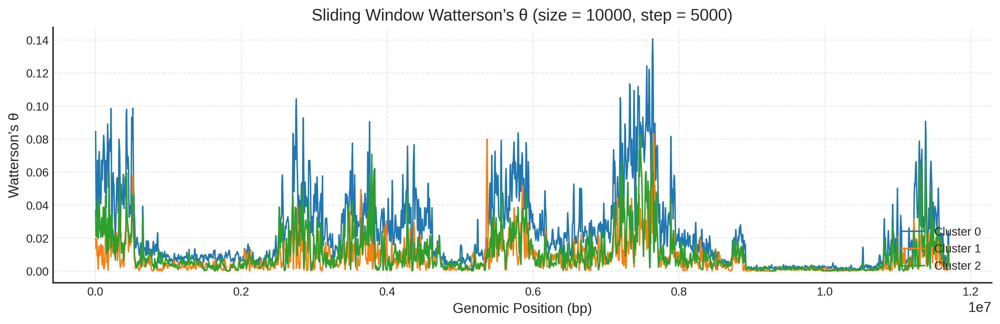

In [436]:
plt.figure(figsize=(12, 4))

for label in theta_lines:
    plt.plot(pos_lines[label], theta_lines[label], label=label, linewidth=1.2)

plt.xlabel("Genomic Position (bp)", fontsize=12)
plt.ylabel("Watterson’s θ", fontsize=12)
plt.title(f"Sliding Window Watterson’s θ (size = {window_size}, step = {step})", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(loc="lower right", frameon=False, fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

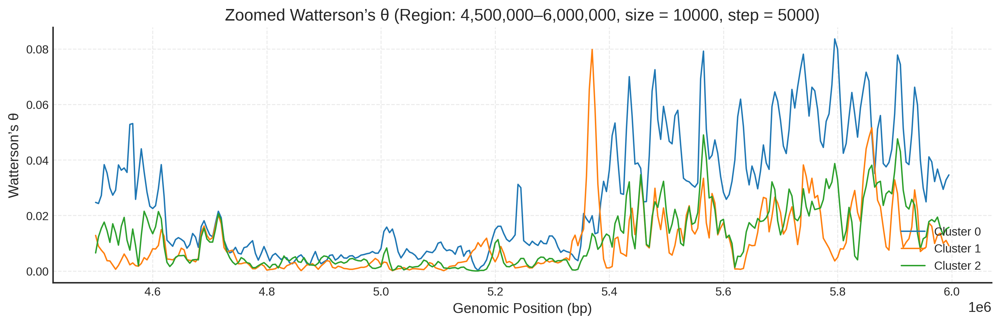

In [437]:
start = 4_500_000
end = 6_000_000

plt.figure(figsize=(12, 4))

for label in theta_lines:
    pos = pos_lines[label]
    vals = np.array(theta_lines[label])  # <=== FIXED
    mask = (pos >= start) & (pos <= end)
    plt.plot(pos[mask], vals[mask], label=label, linewidth=1.2)

plt.xlabel("Genomic Position (bp)", fontsize=12)
plt.ylabel("Watterson’s θ", fontsize=12)
plt.title(f"Zoomed Watterson’s θ (Region: {start:,}–{end:,}, size = {window_size}, step = {step})", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(loc="lower right", frameon=False, fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

In [438]:
# tajima's d boxplot

from collections import defaultdict

grouped_tajd = defaultdict(list)
window_size = 20000
step = 10000

acs = [gn0.count_alleles(), gn1.count_alleles(), gn2.count_alleles()]
cluster_ids = [0, 1, 2]

for cl, ac_sub in zip(cluster_ids, acs):
    for chrom in np.unique(chroms):
        try:
            mask = (chroms == chrom)
            pos_sub = pos_sorted[mask]
            ac_chr = ac_sub[mask]

            if len(pos_sub) < 2 or ac_chr.shape[1] < 2:
                continue

            d_vals, _, _ = allel.windowed_tajima_d(pos_sub, ac_chr, size=window_size, step=step)
            d_vals = d_vals[~np.isnan(d_vals)]

            grouped_tajd[f"Cluster {cl} - {chrom}"].extend(d_vals)

        except:
            continue

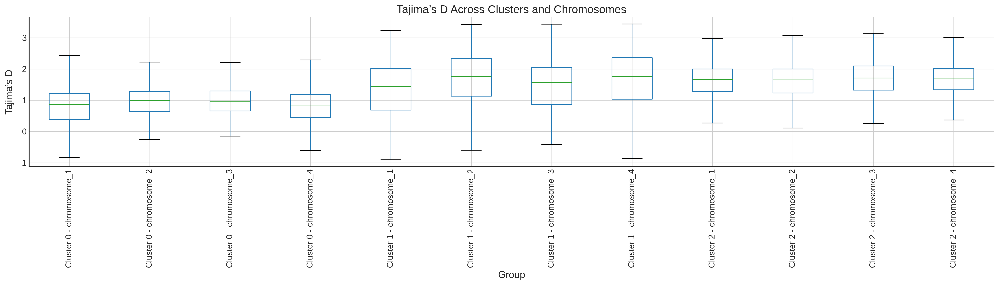

In [439]:
import pandas as pd
import matplotlib.pyplot as plt

flat_tajd = [(label, val) for label, vals in grouped_tajd.items() for val in vals]
df_tajd = pd.DataFrame(flat_tajd, columns=["Group", "Tajimas_D"])

fig, ax = plt.subplots(figsize=(20, 6))
df_tajd.boxplot(column="Tajimas_D", by="Group", rot=90, showfliers=False, ax=ax)
ax.set_ylabel("Tajima’s D")
plt.title("Tajima’s D Across Clusters and Chromosomes")
plt.suptitle("")
plt.tight_layout()
plt.show()

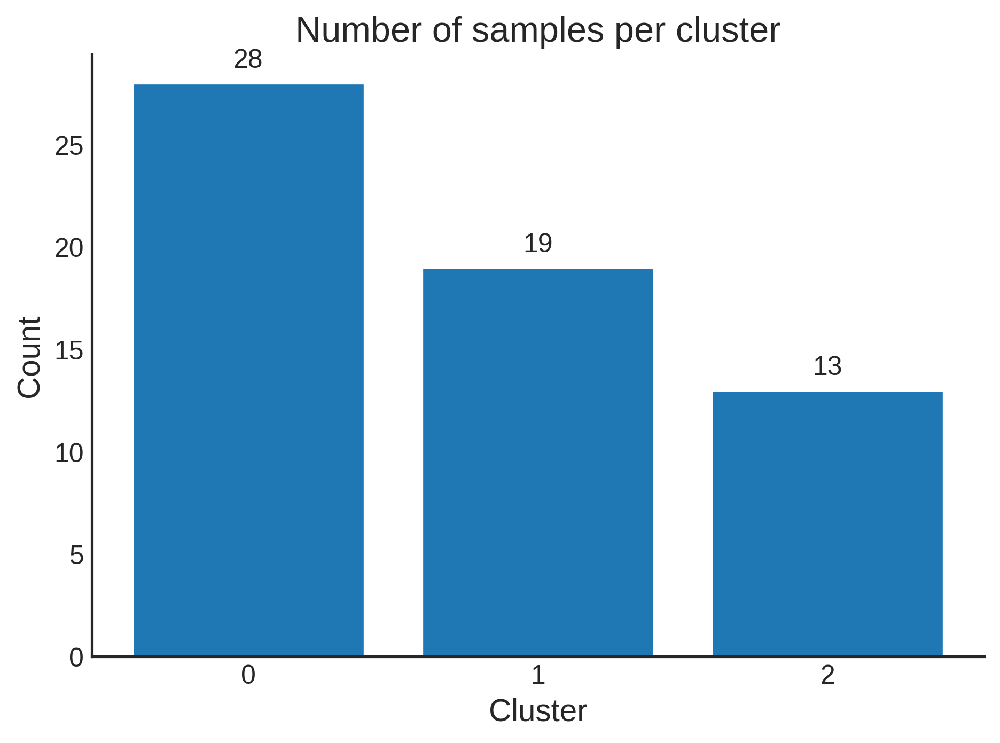

In [441]:
import pandas as pd
import matplotlib.pyplot as plt

# If loading from file
# cluster_data = pd.read_csv('haplo_clusters_updated.csv')

# Compute counts
cluster_counts = cluster_data['Cluster'].value_counts().sort_index()

# Plot
plt.bar(cluster_counts.index, cluster_counts.values)
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Number of samples per cluster')
plt.xticks(cluster_counts.index)

# Add counts on top
for i, count in enumerate(cluster_counts.values):
    plt.text(cluster_counts.index[i], count + 0.5, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

### Windowed hudson_FST

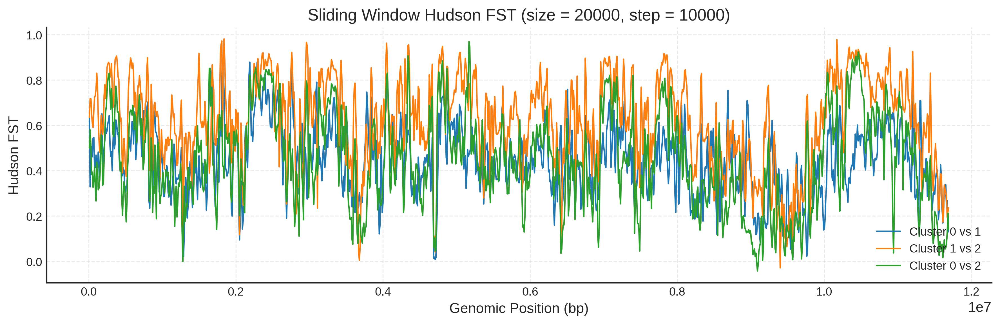

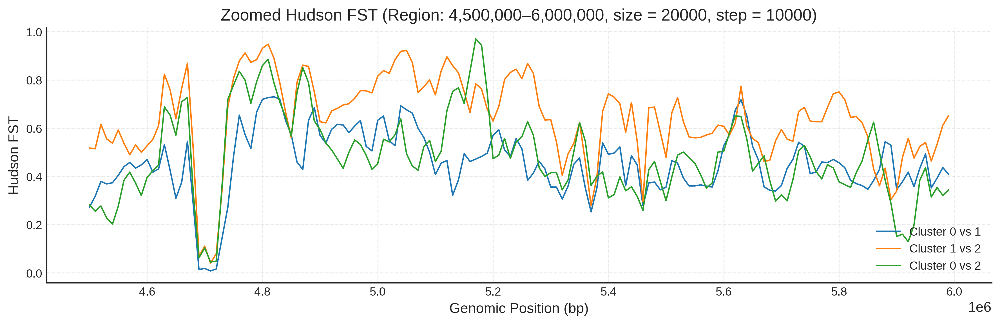

In [444]:
import allel
import numpy as np
import matplotlib.pyplot as plt

# Parameters
window_size = 20000  # 20kb
step_size = 10000    # 10kb

# Compute windowed Hudson FST
fst_01, win_01, _ = allel.windowed_hudson_fst(pos_sorted, ac0, ac1, size=window_size, step=step_size)
fst_12, win_12, _ = allel.windowed_hudson_fst(pos_sorted, ac1, ac2, size=window_size, step=step_size)
fst_02, win_02, _ = allel.windowed_hudson_fst(pos_sorted, ac0, ac2, size=window_size, step=step_size)

# Midpoints of windows
mid_01 = win_01.mean(axis=1)
mid_12 = win_12.mean(axis=1)
mid_02 = win_02.mean(axis=1)

# full plot
plt.figure(figsize=(12, 4))
plt.plot(mid_01, fst_01, label='Cluster 0 vs 1', linewidth=1.2)
plt.plot(mid_12, fst_12, label='Cluster 1 vs 2', linewidth=1.2)
plt.plot(mid_02, fst_02, label='Cluster 0 vs 2', linewidth=1.2)
plt.xlabel("Genomic Position (bp)", fontsize=12)
plt.ylabel("Hudson FST", fontsize=12)
plt.title(f"Sliding Window Hudson FST (size = {window_size}, step = {step_size})", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(loc="lower right", frameon=False, fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

# zoom in
start = 4_500_000
end = 6_000_000

mask_01 = (mid_01 >= start) & (mid_01 <= end)
mask_12 = (mid_12 >= start) & (mid_12 <= end)
mask_02 = (mid_02 >= start) & (mid_02 <= end)

plt.figure(figsize=(12, 4))
plt.plot(mid_01[mask_01], fst_01[mask_01], label='Cluster 0 vs 1', linewidth=1.2)
plt.plot(mid_12[mask_12], fst_12[mask_12], label='Cluster 1 vs 2', linewidth=1.2)
plt.plot(mid_02[mask_02], fst_02[mask_02], label='Cluster 0 vs 2', linewidth=1.2)
plt.xlabel("Genomic Position (bp)", fontsize=12)
plt.ylabel("Hudson FST", fontsize=12)
plt.title(f"Zoomed Hudson FST (Region: {start:,}–{end:,}, size = {window_size}, step = {step_size})", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(loc="lower right", frameon=False, fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

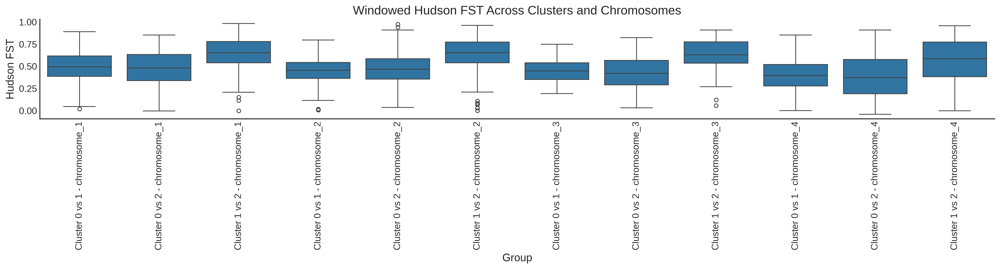

In [445]:
import allel
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

# Parameters
window_size = 20000
step_size = 10000

# Cluster labels and allele counts
acs = [ac0, ac1, ac2]
cluster_ids = [0, 1, 2]

# Container for results
grouped_fst = defaultdict(list)

# Loop over all unique chromosomes
for chrom in np.unique(chroms):
    mask = (chroms == chrom)
    pos_sub = pos_sorted[mask]

    # Skip if no data
    if len(pos_sub) < 2:
        continue

    # Loop over all cluster pair combinations
    for i in range(len(acs)):
        for j in range(i + 1, len(acs)):
            ac1_sub = acs[i][mask]
            ac2_sub = acs[j][mask]

            if ac1_sub.shape[0] < 2 or ac2_sub.shape[0] < 2:
                continue

            try:
                fst_vals, _, _ = allel.windowed_hudson_fst(
                    pos_sub, ac1_sub, ac2_sub,
                    size=window_size, step=step_size
                )
                label = f'Cluster {i} vs {j} - {chrom}'
                grouped_fst[label].extend(fst_vals)
            except Exception as e:
                print(f"Skipped Cluster {i} vs {j}, chr{chrom} due to error: {e}")

# Flatten results into a DataFrame
flat_data = [(label, val) for label, vals in grouped_fst.items() for val in vals]
df = pd.DataFrame(flat_data, columns=["Group", "FST"])

# Plot
plt.figure(figsize=(18, 5))
sns.boxplot(data=df, x='Group', y='FST')
plt.xticks(rotation=90)
plt.xlabel("Group")
plt.ylabel("Hudson FST")
plt.title("Windowed Hudson FST Across Clusters and Chromosomes")
plt.tight_layout()
plt.show()